In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import geopandas as gpd
import contextily as cx
import datetime
import seaborn as sns

pd.set_option('display.max_colwidth', 0)
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)
import warnings
warnings.filterwarnings('ignore')

In [2]:
bound_lat = [24.776468,25.451666]
bound_lon = [54.842954,55.680861] # 25.637066, 55.849584 

# Read address data

In [22]:
# import gzip

# with open('../data/Talabat/mit_base_address/mit_base_address.csv', 'rb') as fd:
#     gzip_fd = gzip.GzipFile(fileobj=fd)
#     df1 = pd.read_csv(gzip_fd)

In [24]:
# df1.to_csv('../data/Talabat/mit_base_address/mit_base_address2.csv',sep=',',index=False)

In [27]:
# df1.head()

,account_id,address_id,src_address_id,area,zone,country,city,address_type,is_primary,current_flag,longitude,latitude,no_of_orders,last_order_date,first_order_date
0,216,1694805,1841927,Old Airport,Doha,Qatar,Doha,apartment,False,Y,51.561446,25.251193,95,2024-01-28,2019-01-11
1,216,49202155,118828786,Ghala Industrial Estate,Bosher,Oman,Bosher,apartment,False,Y,58.335700,23.582400,2,2022-12-06,2022-09-15
2,216,16386780,36634923,Amwaj,Bahrain,Bahrain,Bahrain,apartment,False,Y,26.286944,50.666129,21,2021-05-03,2021-03-14
3,216,11594988,31976845,Al Sadd,Doha,Qatar,Doha,apartment,False,Y,25.285791,51.505269,1,2020-12-12,2020-12-12
4,216,13578725,33904476,Al Ansab,Bosher,Oman,Bosher,apartment,False,Y,58.361244,23.558891,70,2021-08-28,2021-05-06


In [31]:
# print('Total number of accounts:', df1.account_id.unique().shape[0])
# print('Total number of address:', df1.address_id.unique().shape[0])

Total number of accounts: 1709683
Total number of address: 8841836


In [33]:
# Only use Dubai data
# df1 = df1[df1['city']=='Dubai']

In [36]:
# print('Total number of accounts in Dubai:', df1.account_id.unique().shape[0])
# print('Total number of address in Dubai:', df1.address_id.unique().shape[0])

Total number of accounts in Dubai: 1588129
Total number of address in Dubai: 5139606


In [3]:
df_address = pd.read_csv("../data/Talabat/mit_base_address/mit_base_address2.csv", sep=',', header=0)

# Read incentive data

In [17]:
%%time

import os

directory = os.fsencode("../data/Talabat/mit_base_orders_incentives/")
selected_month = 10
df_order = pd.DataFrame()

i = 0
for file in os.listdir(directory):
    filename = os.fsdecode(file)
    i+=1
    if i%10==0:print(datetime.datetime.now(),i,'/',len(os.listdir(directory)))
    if filename.endswith(".csv"):
        sub_path = os.path.join("../data/Talabat/mit_base_orders_incentives/", filename)
        df_order_sub = pd.read_csv(sub_path, sep=',', header=0,compression='gzip')
        # df_order_sub['order_date'] = pd.to_datetime(df_order_sub['order_date'])
        # df_order_sub = df_order_sub[(df_order_sub['order_date'].dt.month == selected_month)&(df_order_sub['order_date'].dt.year == 2023)]
        df_order = pd.concat([df_order, df_order_sub], ignore_index=True)
    else:
        continue

2024-05-02 14:25:37.302783 30 / 43
CPU times: user 26.9 s, sys: 10.3 s, total: 37.2 s
Wall time: 37.5 s


In [20]:
df_order.to_csv("../data/Talabat/mit_base_orders_incentives.csv", index=False)

In [2]:
df_localness = pd.read_csv('./output/food_localness_with_restaurant_count_oct.csv')

In [9]:
%%time
# df_incentive = pd.read_csv("../data/Talabat/mit_base_orders_incentives.csv", sep=',', header=0)
# order_oct_list = df_localness.order_id.unique().tolist()
# print(len(order_oct_list))
# df_incentive = df_incentive[df_incentive['order_id'].isin(order_oct_list)]
# print(df_incentive.shape[0])
# df_incentive.drop_duplicates(keep='last', inplace=True)
# df_incentive.to_csv("./output/mit_base_orders_incentives_oct.csv", index=False)

CPU times: user 4.82 s, sys: 160 ms, total: 4.99 s
Wall time: 5.18 s


In [49]:
df_incentive = pd.read_csv("./output/mit_base_orders_incentives_oct.csv", sep=',', header=0)

In [50]:
print(df_incentive.shape[0])
print(df_incentive.order_id.unique().shape[0])

1274548
1085207


In [51]:
df_incentive.incentive_type.value_counts()

incentive_type
vendor offers     1145181
talabat offers    129367 
Name: count, dtype: int64

In [52]:
df_incentive.incentive_sub_type.value_counts()

incentive_sub_type
menu discount          620671
item discount          173752
gem                    170632
discounted delivery    147804
voucher wallet         99979 
free delivery          32322 
compensation           29388 
Name: count, dtype: int64

In [53]:
# %%time
# group_count_results = df_incentive.groupby('order_id').count().reset_index()
# morethanonerecords = group_count_results[group_count_results['incentive_type']>1]
# morethanonerecords.head()
# df_incentive[df_incentive['order_id']==986635613]

In [54]:
df_incentive.head(3)

,order_id,incentive_type,incentive_sub_type,incentive_amount_eur,incentive_amount_lc
0,1295702996,vendor offers,item discount,0.207831,0.8
1,1300911192,vendor offers,menu discount,0.411192,1.6
2,1293897352,vendor offers,item discount,0.412347,1.6


In [55]:
df_incentive[['incentive_type', 'incentive_sub_type']].drop_duplicates()

,incentive_type,incentive_sub_type
0,vendor offers,item discount
1,vendor offers,menu discount
7,vendor offers,discounted delivery
384,vendor offers,free delivery
510,talabat offers,voucher wallet
3841,talabat offers,compensation
11827,vendor offers,gem


In [56]:
# df_incentive = df_incentive[['order_id','incentive_sub_type','incentive_amount_lc']]
df_incentive.drop_duplicates(keep='last', inplace=True)
print(df_incentive.shape[0])

1274548


In [72]:
# there are some duplicates based on these two columns, check those!!
group_count_results = df_incentive.groupby(['order_id','incentive_sub_type']).count().reset_index()
morethanonerecords = group_count_results[group_count_results['incentive_type']>1]
check_idlist = morethanonerecords.order_id.unique().tolist()
print(len(check_idlist))

14282


In [71]:
df_incentive[df_incentive['order_id']==1333298684]

,order_id,incentive_type,incentive_sub_type,incentive_amount_eur,incentive_amount_lc
627992,1333298684,vendor offers,item discount,2.058969,8.0
1176360,1333298684,vendor offers,item discount,1.956021,7.6


In [74]:
print(df_incentive.shape[0])
df_incentive_distinct = df_incentive.groupby(['order_id','incentive_type','incentive_sub_type']).sum().reset_index()
print(df_incentive_distinct.shape[0])

1274548
1258847


In [84]:
print(df_incentive_distinct.order_id.unique().shape[0])

1085207


In [83]:
df_incentive_distinct[df_incentive_distinct['incentive_sub_type'].isna()]

,order_id,incentive_type,incentive_sub_type,incentive_amount_eur,incentive_amount_lc


In [77]:
%%time
pivoted_df = df_incentive_distinct.pivot(index='order_id',columns='incentive_sub_type',values='incentive_amount_lc')
# pivoted_df = df_incentive.pivot(columns=['order_id','incentive_sub_type'],values=['incentive_amount_lc']).reset_index()

CPU times: user 597 ms, sys: 145 ms, total: 742 ms
Wall time: 775 ms


In [85]:
pivoted_df = pivoted_df.fillna(0)

In [87]:
pivoted_df.to_csv('./output/mit_base_orders_incentives_oct.csv')

# Read order data

In [12]:
%%time

import os

directory = os.fsencode("../data/Talabat/mit_base_orders/")
# selected_month = 10
# df_order = pd.DataFrame()
date_list = []

i = 0
for file in os.listdir(directory):
    filename = os.fsdecode(file)
    i+=1
    if i%30==0:print(datetime.datetime.now(),i,'/',len(os.listdir(directory)))
    if filename.endswith(".csv"):
        sub_path = os.path.join("../data/Talabat/mit_base_orders/", filename)
        df_order_sub = pd.read_csv(sub_path, sep=',', header=0)
        df_order_sub['order_date'] = pd.to_datetime(df_order_sub['order_date'])
        date_list.extend(df_order_sub['order_date'].unique().tolist())
        # df_order_sub = df_order_sub[(df_order_sub['order_date'].dt.month == selected_month)&(df_order_sub['order_date'].dt.year == 2023)]
        # df_order = pd.concat([df_order, df_order_sub], ignore_index=True)
        continue
    else:
        continue

,account_id,order_id,country_code,order_date,order_date_utc,order_time,order_time_utc,chain_name,chain_name_arabic,main_cuisine,secondary_verticals,vertical,vertical_class,vendor_id,vendor_name,is_grocery,is_grocery_darkstore,is_tgo,vendor_location,location_id,sub_vertical,vendor_address,Is_kitchen,Is_non_food,gmv_amount_lc,gmv_amount_eur,delivery_fee_amount_lc,service_fee_amount_lc,basket_amount_lc,delivery_arrangement,delivery_birdseye_distance_m,customer_selected_location,accepted_by_vendor_at,vendor_prepared_at,picked_up_at,delivered_at,is_successful,is_incentive_applied,incentive_amount_eur,incentive_amount_lc,pickup_id,package_picked_up_rank,package_delivered_rank,is_primary,is_talabat
0,7680872,1342665254,AE,2023-11-07,2023-11-07,2023-11-07 20:48:12,2023-11-07 16:48:12 UTC,312,312,american,NaN,food,food,15921,"312 , Al Sufouh 1",False,False,True,POINT(55.175844 25.107854),565,NaN,m97TS6GZDQJgHaXLPqYlIpsvRyQNxkqPaiYOvWjJdoE=,False,False,103.22,26.272332,5.5,3.72,124.0,TGO,NaN,POINT(55.1538981869817 25.1292069931587),2023-11-07 16:51:00.120007 UTC,2023-11-07 17:06:36.011085 UTC,2023-11-07 17:08:23.182 UTC,2023-11-07 17:46:55.083 UTC,True,True,7.635826,30.0,257555015,1,1,True,True
1,7673432,1342782748,AE,2023-11-07,2023-11-07,2023-11-07 22:05:49,2023-11-07 18:05:49 UTC,312,312,american,NaN,food,food,15921,"312 , Al Sufouh 1",False,False,True,POINT(55.175844 25.107854),565,NaN,m97TS6GZDQJgHaXLPqYlIpsvRyQNxkqPaiYOvWjJdoE=,False,False,36.70,9.341161,5.5,1.20,40.0,TGO,NaN,POINT(55.151627 25.08908),2023-11-07 18:09:20.012241 UTC,NaN,2023-11-07 18:22:43.196 UTC,2023-11-07 18:32:33.922 UTC,True,True,2.545275,10.0,257583547,1,1,True,True
2,35392696,1342498047,AE,2023-11-07,2023-11-07,2023-11-07 18:57:32,2023-11-07 14:57:32 UTC,312,312,american,NaN,food,food,15921,"312 , Al Sufouh 1",False,False,True,POINT(55.175844 25.107854),565,NaN,m97TS6GZDQJgHaXLPqYlIpsvRyQNxkqPaiYOvWjJdoE=,False,False,63.77,16.231221,3.0,1.77,59.0,TGO,NaN,POINT(55.1784678921103 25.1080211899969),2023-11-07 14:59:29.256132 UTC,2023-11-07 15:13:59.971599 UTC,2023-11-07 15:19:15.437 UTC,2023-11-07 15:34:52.351 UTC,True,NaN,NaN,NaN,257508451,1,1,True,True
3,34705129,1342570109,AE,2023-11-07,2023-11-07,2023-11-07 19:46:51,2023-11-07 15:46:51 UTC,LUSH,لش,cosmetics,"Specialty Stores,Pharmacy",cosmetics,non-food,705449,"Lush, IBN Batuta",False,False,True,POINT(55.122248617605 25.0467786311748),630,NaN,gHIhq1Z6Qnh9RpdFZISbLLjfY2je4tGGhMzYMbS2PeM=,False,True,658.90,167.708193,10.0,3.90,645.0,TGO,NaN,POINT(55.21625 25.060549),2023-11-07 15:48:57.746956 UTC,2023-11-07 16:10:48.209631 UTC,2023-11-07 16:10:52.065 UTC,2023-11-07 16:43:28.116 UTC,True,True,0.000000,0.0,257529191,1,1,True,True
4,21549770,1342226187,AE,2023-11-07,2023-11-07,2023-11-07 14:51:05,2023-11-07 10:51:05 UTC,Ana,انا,beverages,NaN,food,food,602931,"Ana, Downtown Burj Khalifa",False,False,True,POINT(55.2788728737912 25.1961107314817),594,NaN,RX+M2uctzUKiTBSXDigTSxoxOXbQQVL3dyMVZiYTNkw=,False,False,144.90,36.881040,9.0,3.90,132.0,TGO,NaN,POINT(55.213135 25.104006),2023-11-07 10:54:01.651362 UTC,2023-11-07 11:12:52.864042 UTC,2023-11-07 11:16:21.574 UTC,2023-11-07 11:52:17.868 UTC,True,NaN,NaN,NaN,257435652,1,1,True,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99325,28300924,1342056518,AE,2023-11-07,2023-11-07,2023-11-07 11:48:42,2023-11-07 07:48:42 UTC,"Something Healthy - High Protein, Keto & Vegan Eats",سمثينج هيلثي - يحتوي على نسبة عالية من البروتين والكيتو والأكل النباتي,healthy,NaN,food,food,683880,"Something Healthy, Business bay 2 - (9 Tower)",False,False,True,POINT(55.272264 25.186609),588,NaN,aPNcv2L667KihtGzG2MoSZi7hratcNhUi4wGhU6Khcc=,True,False,36.05,9.175718,0.0,1.05,35.0,TGO,NaN,POINT(55.318115 25.212774),2023-11-07 07:49:47.323509 UTC,NaN,2023-11-07 08:13:23.748 UTC,2023-11-07 08:36:00.956 UTC,True,NaN,NaN,NaN,257386738,1,1,True,True
99326,19643826

CPU times: user 1.21 s, sys: 177 ms, total: 1.39 s
Wall time: 1.41 s


In [222]:
len(date_list)
myset = set(date_list)
print(len(myset))
print(min(date_list),max(date_list))

365
2023-01-01 00:00:00 2023-12-31 00:00:00


In [34]:
# %%time

# import os

# directory = os.fsencode("../data/Talabat/mit_base_orders/")
# selected_month = 10
# df_order = pd.DataFrame()

# i = 0
# for file in os.listdir(directory):
#     filename = os.fsdecode(file)
#     i+=1
#     if i%30==0:print(datetime.datetime.now(),i,'/',len(os.listdir(directory)))
#     if filename.endswith(".csv"):
#         sub_path = os.path.join("../data/Talabat/mit_base_orders/", filename)
#         df_order_sub = pd.read_csv(sub_path, sep=',', header=0)
#         df_order_sub['order_date'] = pd.to_datetime(df_order_sub['order_date'])
#         df_order_sub = df_order_sub[(df_order_sub['order_date'].dt.month == selected_month)&(df_order_sub['order_date'].dt.year == 2023)]
#         df_order = pd.concat([df_order, df_order_sub], ignore_index=True)
#         continue
#     else:
#         continue

2024-03-04 14:41:43.998232 30 / 663
2024-03-04 14:42:15.709100 60 / 663
2024-03-04 14:42:52.986052 90 / 663
2024-03-04 14:43:26.562807 120 / 663
2024-03-04 14:43:59.604639 150 / 663
2024-03-04 14:44:35.484497 180 / 663
2024-03-04 14:45:16.109570 210 / 663
2024-03-04 14:45:56.827882 240 / 663
2024-03-04 14:46:50.928335 270 / 663
2024-03-04 14:47:44.691329 300 / 663
2024-03-04 14:48:39.013555 330 / 663
2024-03-04 14:49:34.559268 360 / 663
2024-03-04 14:50:30.565771 390 / 663
2024-03-04 14:51:30.906561 420 / 663
2024-03-04 14:52:26.604496 450 / 663
2024-03-04 14:53:29.009871 480 / 663
2024-03-04 14:54:29.451815 510 / 663
2024-03-04 14:55:40.975812 540 / 663
2024-03-04 14:56:47.571564 570 / 663
2024-03-04 14:57:57.769450 600 / 663
2024-03-04 14:59:01.496421 630 / 663
2024-03-04 15:00:08.801008 660 / 663
CPU times: user 14min 23s, sys: 4min 22s, total: 18min 45s
Wall time: 18min 59s


In [43]:
# df_order.to_csv('../data/Talabat/order_202310.csv',sep=',',index=False) # this is 2023 Oct Talabat order data

In [47]:
print('total number of orders in 2023',selected_month,':',df_order.shape[0])

total number of orders in 2023 10 : 3619913


limit the data in or near Dubai city region

In [41]:
%%time
df_order['customer_lon'] = df_order['customer_selected_location'].str.split(' ').str[0]
df_order['customer_lon'] = df_order['customer_lon'].str.split('(').str[1]
df_order['customer_lat'] = df_order['customer_selected_location'].str.split(' ').str[1]
df_order['customer_lat'] = df_order['customer_lat'].str.split(')').str[0]
df_order['customer_lon'] = df_order['customer_lon'].astype(float)
df_order['customer_lat'] = df_order['customer_lat'].astype(float)

df_order['vendor_lon'] = df_order['vendor_location'].str.split(' ').str[0]
df_order['vendor_lon'] = df_order['vendor_lon'].str.split('(').str[1]
df_order['vendor_lat'] = df_order['vendor_location'].str.split(' ').str[1]
df_order['vendor_lat'] = df_order['vendor_lat'].str.split('\)').str[0]
df_order['vendor_lon'] = df_order['vendor_lon'].astype(float)
df_order['vendor_lat'] = df_order['vendor_lat'].astype(float)

In [45]:
%%time
df_order = df_order[(df_order['customer_lon']>= bound_lon[0]) & (df_order['customer_lon']<= bound_lon[1])]
df_order = df_order[(df_order['customer_lat']>= bound_lat[0]) & (df_order['customer_lat']<= bound_lat[1])]
print(df_order.shape[0])

3619913
CPU times: user 4 s, sys: 4.64 s, total: 8.64 s
Wall time: 10.3 s


# Home locations

This section just for fun

Note that people may order from a location different from home

According to gpd_home.address_type, a delivered location can be apartment, house, or office

In [4]:
df_address = df_address[(df_address['country'] == 'UAE') & (df_address['city']=='Dubai')] 
# df_address.to_csv('../data/Talabat/dubai_address.csv',sep=',',index=False) 
print(df_address.shape[0])
df_address.head()

5139606


,account_id,address_id,src_address_id,area,zone,country,city,address_type,is_primary,current_flag,longitude,latitude,no_of_orders,last_order_date,first_order_date
15,903,31049185,100992406,Academic City,Mirdif,UAE,Dubai,apartment,False,Y,55.417970,25.128857,33,2021-12-13,2021-09-17
16,903,61173092,130133043,Za'abeel 2,Business bay,UAE,Dubai,apartment,False,Y,55.289400,25.194200,7,2023-03-14,2023-03-10
17,903,31458054,101323033,Za'abeel 2,Business bay,UAE,Dubai,apartment,False,Y,55.278922,25.202792,2,2021-09-24,2021-09-24
19,1008,8253667,28590302,The Palm Jumeirah,The Palm Jumeirah,UAE,Dubai,apartment,False,Y,55.142570,25.111924,67,2024-02-17,2020-10-09
20,1008,51667982,121294677,Dubai World Trade Center - DWTC,Dubai World Trade Center,UAE,Dubai,apartment,False,Y,55.286247,25.228638,5,2023-10-19,2022-10-08


In [6]:
df_address = df_address[(df_address['longitude']>= bound_lon[0]) & (df_address['longitude']<= bound_lon[1])]
df_address = df_address[(df_address['latitude']>= bound_lat[0]) & (df_address['latitude']<= bound_lat[1])]
print(df_address.shape[0])
df_address.drop_duplicates(keep="last",inplace=True)
print(df_address.shape[0],df_address.account_id.unique().shape[0])

5398814
5398814 1615953


In [5]:
df_address.address_type.value_counts()

address_type
apartment    3871113
house        705163 
office       563330 
Name: count, dtype: int64

In [48]:
%%time
#Converting Pandas DataFrame to GeoDataFrame
from shapely.geometry import Point
from geopandas import GeoDataFrame

geometry = [Point(xy) for xy in zip(df_address.longitude, df_address.latitude)]
gpd_home = GeoDataFrame(df_address, crs="EPSG:4326", geometry=geometry)

CPU times: user 1min 11s, sys: 5.18 s, total: 1min 16s
Wall time: 1min 18s


In [49]:
gpd_home.head(2)

,account_id,address_id,src_address_id,area,zone,country,city,address_type,is_primary,current_flag,longitude,latitude,no_of_orders,last_order_date,first_order_date,geometry
15,903,31049185,100992406,Academic City,Mirdif,UAE,Dubai,apartment,False,Y,55.41797,25.128857,33,2021-12-13,2021-09-17,POINT (55.41797 25.12886)
16,903,61173092,130133043,Za'abeel 2,Business bay,UAE,Dubai,apartment,False,Y,55.28940,25.194200,7,2023-03-14,2023-03-10,POINT (55.28940 25.19420)


In [65]:
# %%time
# import geoplot as gplt
# import geoplot.crs as gcrs
# ax = gplt.webmap(gpd_home, projection=gcrs.WebMercator(), zorder=1)
# gplt.kdeplot(gpd_home, cmap='Reds',  shade=True,ax=ax, alpha=0.4)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


CPU times: user 4min 5s, sys: 6.22 s, total: 4min 11s
Wall time: 4min 17s


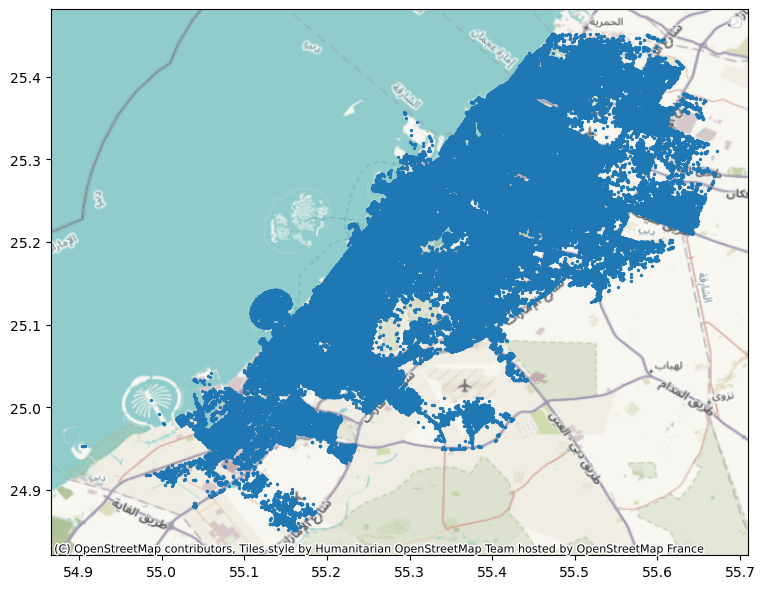

In [66]:
%%time

import contextily as cx

f, ax = plt.subplots(1, figsize=(9, 9))
gpd_home.plot(ax=ax, markersize=2)
cx.add_basemap(ax,crs=gpd_home.crs)
plt.legend()

# Customer selected locations
not sure about this but customer_selected_location perhaps indicate the delivered location?

In [79]:
df_deliveredlocation = df_order[['customer_selected_location']]
print(df_deliveredlocation.shape[0])
df_deliveredlocation.drop_duplicates(keep="last",inplace=True)
print(df_deliveredlocation.shape[0])

3619913
906642


In [80]:
%%time
df_deliveredlocation['geometry'] = gpd.GeoSeries.from_wkt(df_deliveredlocation['customer_selected_location'])
df_deliveredlocation = df_deliveredlocation.drop(['customer_selected_location'], axis=1)
gdf_deliveredlocation = gpd.GeoDataFrame(df_deliveredlocation, crs="EPSG:4326",  geometry='geometry')

CPU times: user 2.15 s, sys: 3.04 s, total: 5.18 s
Wall time: 7.89 s


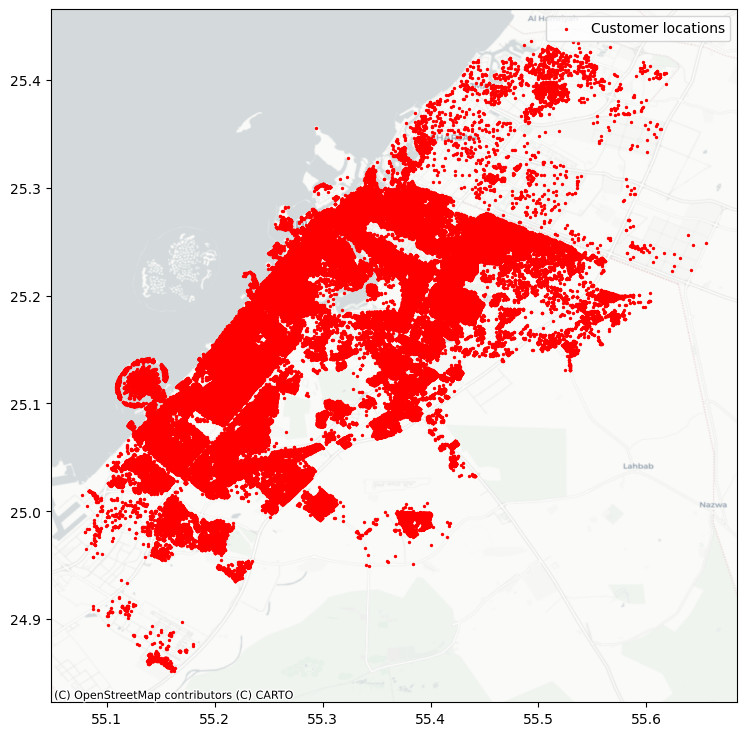

CPU times: user 47.6 s, sys: 1.14 s, total: 48.7 s
Wall time: 50.6 s


In [82]:
%%time
f, ax = plt.subplots(1, figsize=(9, 9))
gdf_deliveredlocation.plot(ax=ax, markersize=2,color='red',label='Customer locations')
cx.add_basemap(ax,crs=gdf_deliveredlocation.crs,source=cx.providers.CartoDB.Positron)
plt.legend()
plt.show()

# Order data

In [53]:
from datetime import datetime, timedelta

import plotly.express as px
import plotly.graph_objects as go

In [87]:
print('total unique vendor count: ',df_order['vendor_id'].unique().shape[0])

total unique vendor count:  9686


In [88]:
df_order['vertical_class'].value_counts(normalize=True).sort_index(ascending=False)

vertical_class
non-food    0.192657
food        0.807343
Name: proportion, dtype: float64

In [89]:
df_order['vertical'].value_counts(normalize=True).sort_index(ascending=False)

vertical
pharmacy     0.021375
grocery      0.169670
food         0.807343
flowers      0.001528
cosmetics    0.000084
Name: proportion, dtype: float64

In [90]:
# df_order['is_grocery'].value_counts()

In [58]:
%%time
df_order['order_time'] = pd.to_datetime(df_order['order_time'])
df_order['order_time_hour'] = df_order.order_time.dt.hour

### number of order by time of day

Text(0.5, 1.0, 'All order')

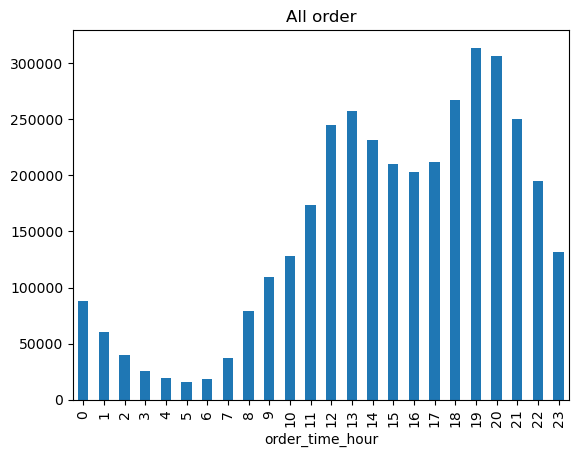

In [249]:
df_order.order_time_hour.value_counts().sort_index().plot(kind='bar')
plt.title("All order") 

Text(0.5, 1.0, 'Grocery')

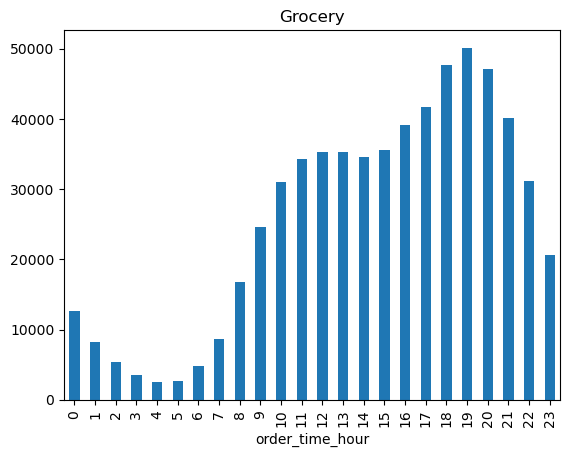

In [60]:
# grocery orders:
df_order[df_order['is_grocery']==True].order_time_hour.value_counts().sort_index().plot(kind='bar')
plt.title("Grocery") 

Text(0.5, 1.0, 'Food')

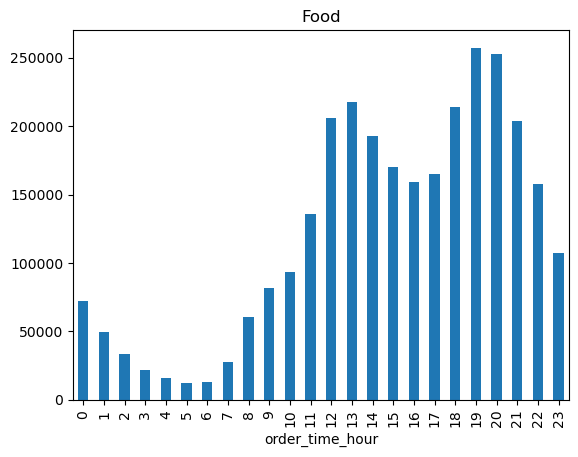

In [61]:
# non-grocery orders:
df_order[df_order['vertical']=='food'].order_time_hour.value_counts().sort_index().plot(kind='bar')
plt.title("Food") 

### delivery time (minutes): delivered_at - picked_up_at

In [105]:
df_order.head(2)

,account_id,order_id,country_code,order_date,order_date_utc,order_time,order_time_utc,chain_name,chain_name_arabic,main_cuisine,secondary_verticals,vertical,vertical_class,vendor_id,vendor_name,is_grocery,is_grocery_darkstore,is_tgo,vendor_location,location_id,sub_vertical,vendor_address,Is_kitchen,Is_non_food,gmv_amount_lc,gmv_amount_eur,delivery_fee_amount_lc,service_fee_amount_lc,basket_amount_lc,delivery_arrangement,delivery_birdseye_distance_m,customer_selected_location,accepted_by_vendor_at,vendor_prepared_at,picked_up_at,delivered_at,is_successful,is_incentive_applied,incentive_amount_eur,incentive_amount_lc,pickup_id,package_picked_up_rank,package_delivered_rank,is_primary,is_talabat,customer_lon,customer_lat,vendor_lon,vendor_lat,order_time_hour,delivery_duration
0,4285647,1305786978,AE,2023-10-10,2023-10-10,2023-10-10 18:37:22,2023-10-10 18:37:22+04:00,312,312,american,NaN,food,food,15921,"312 , Al Sufouh 1",False,False,True,POINT(55.175844 25.107854),565,NaN,m97TS6GZDQJgHaXLPqYlIpsvRyQNxkqPaiYOvWjJdoE=,False,False,89.86,23.072484,9.0,2.36,78.5,TGO,NaN,POINT(55.22939 25.164577),2023-10-10 14:39:13.330322 UTC,2023-10-10 14:51:44.525067 UTC,2023-10-10 18:54:08.409000+04:00,2023-10-10 19:31:44.836000+04:00,True,NaN,NaN,NaN,249215302.0,1.0,1.0,True,True,55.229390,25.164577,55.175844,25.107854,18,37
1,6623723,1304803532,AE,2023-10-10,2023-10-09,2023-10-10 01:59:24,2023-10-10 01:59:24+04:00,Bao,باو,asian,NaN,food,food,680435,Bao,False,False,True,POINT(55.509945 25.223272),3815,NaN,PsvsUBNN7jxRJMzvOOqlt6FDcE1RD2Q0O+Cm/b/FamE=,False,False,80.82,20.751371,4.0,2.82,94.0,TGO,NaN,POINT(55.519188 25.23093),2023-10-09 22:01:27.587251 UTC,2023-10-09 22:12:53.932178 UTC,2023-10-10 02:13:33.264000+04:00,2023-10-10 02:19:27.924000+04:00,True,True,5.135207,20.0,249057659.0,1.0,1.0,True,True,55.519188,25.230930,55.509945,25.223272,1,5


In [104]:
%%time
df_order['order_time_utc'] = pd.to_datetime(df_order['order_time_utc'], format='mixed', utc=True, infer_datetime_format=True)
df_order['order_time_utc'] = df_order['order_time_utc'].dt.tz_convert('Asia/Dubai')

CPU times: user 6min 31s, sys: 1.19 s, total: 6min 33s
Wall time: 6min 34s


In [77]:
%%time
df_order['picked_up_at'] = pd.to_datetime(df_order['picked_up_at'], format='mixed', utc=True, infer_datetime_format=True)
df_order['picked_up_at'] = df_order['picked_up_at'].dt.tz_convert('Asia/Dubai')

In [86]:
%%time
df_order['delivered_at'] = pd.to_datetime(df_order['delivered_at'], format='mixed', utc=True, infer_datetime_format=True)
df_order['delivered_at'] = df_order['delivered_at'].dt.tz_convert('Asia/Dubai')

In [92]:
# %%time
# optional, i do not use these two columns so far
# df_order['accepted_by_vendor_at'] = pd.to_datetime(df_order['accepted_by_vendor_at'], format='mixed', utc=True, infer_datetime_format=True)
# df_order['accepted_by_vendor_at'] = df_order['accepted_by_vendor_at'].dt.tz_convert('Asia/Dubai')
# df_order['vendor_prepared_at'] = pd.to_datetime(df_order['vendor_prepared_at'], format='mixed', utc=True, infer_datetime_format=True)
# df_order['vendor_prepared_at'] = df_order['vendor_prepared_at'].dt.tz_convert('Asia/Dubai')

CPU times: user 19.9 ms, sys: 12.7 ms, total: 32.7 ms
Wall time: 30.9 ms


In [100]:
# eliminate rows with null delivered_at, picked_up_at 
df_order = df_order[df_order['delivered_at'].notna()]
print(df_order.shape[0])
df_order = df_order[df_order['picked_up_at'].notna()]
print(df_order.shape[0])
df_order = df_order[df_order['order_time_utc'].notna()]
print(df_order.shape[0])

3619871
3619871


In [106]:
# df_order = df_order[df_order['order_time_utc'].notna()]
# print(df_order.shape[0])

3619871


In [107]:
df_order['delivery_duration'] = df_order['delivered_at'] - df_order['picked_up_at']  # delivery trip duration
df_order['delivery_duration'] = df_order['delivery_duration'].dt.total_seconds().div(60).astype(int)

df_order['total_duration'] = df_order['delivered_at'] - df_order['order_time_utc'] # order waiting duration
df_order['total_duration'] = df_order['total_duration'].dt.total_seconds().div(60).astype(int)

In [115]:
df_order = df_order[df_order['delivery_duration']<=180] # I exclude those records with delivery duration higher than 180min
print(df_order.shape[0])
df_order = df_order[df_order['total_duration']<=180]
print(df_order.shape[0])

3619764
3617110


count    3.617110e+06
mean     2.045538e+01
std      1.057777e+01
min      0.000000e+00
25%      1.300000e+01
50%      1.800000e+01
75%      2.500000e+01
max      1.720000e+02
Name: delivery_duration, dtype: float64

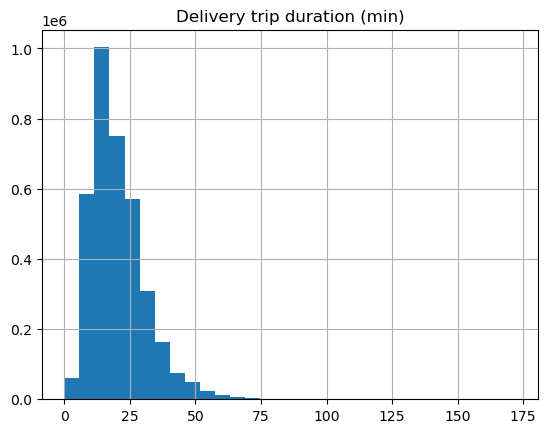

In [123]:
df_order['delivery_duration'].hist(bins=30)
plt.title("Delivery trip duration (min)") 
df_order['delivery_duration'].describe()

count    3.617110e+06
mean     3.987193e+01
std      1.629562e+01
min      2.000000e+00
25%      2.900000e+01
50%      3.700000e+01
75%      4.800000e+01
max      1.800000e+02
Name: total_duration, dtype: float64

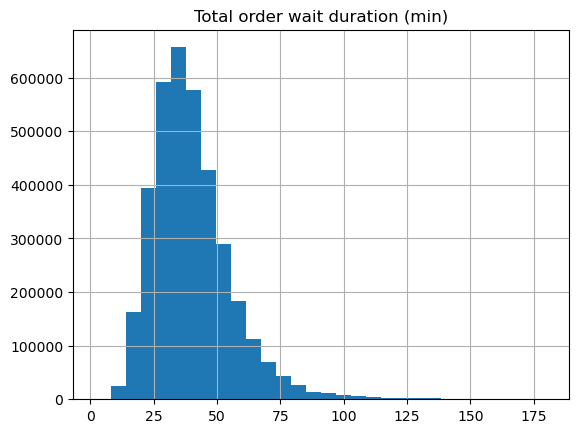

In [122]:
df_order['total_duration'].hist(bins=30)
plt.title("Total order wait duration (min)") 
df_order['total_duration'].describe()

# Vendor

In [133]:
df_vendor = df_order[['vendor_id','vendor_location','location_id','vertical_class','vertical','vendor_name','is_grocery','is_grocery_darkstore']]
print(df_vendor.shape[0])
# print(df_vendor['vendor_id'].unique().shape[0])
df_vendor.drop_duplicates(keep="last",inplace=True)
# print(df_vendor.shape[0])
print("total number of vendors:",df_vendor['vendor_id'].unique().shape[0])

3617110
total number of vendors: 9686


In [134]:
df_vendor.head()

,vendor_id,vendor_location,location_id,vertical_class,vertical,vendor_name,is_grocery,is_grocery_darkstore
10571,682312,POINT(55.480083 25.319861),953,food,food,"Starbucks, Al Jada",False,False
41111,663746,POINT(55.3929167 25.3694444),905,food,food,"Harees & Mahashi, Al Mujarah",False,False
42938,39238,POINT(55.4323845711643 25.3933738839466),3837,food,food,"Al Rukn Al Arabi, Al Sawan,Al Rashidiya 3",False,False
46552,714271,POINT(55.1415839576721 25.0684848762393),650,food,food,"Not Only Fish, Jumeirah Lakes Towers - JLT",False,False
49620,709554,POINT(55.1246018109817 25.0776254860932),647,food,food,"Pasta La Pizza, Bluewaters Island",False,False


In [135]:
df_vendor['geometry'] = gpd.GeoSeries.from_wkt(df_vendor['vendor_location'])
df_vendor = df_vendor.drop(['vendor_location'], axis=1)
gdf_vendor = gpd.GeoDataFrame(df_vendor, crs="EPSG:4326",  geometry='geometry')

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


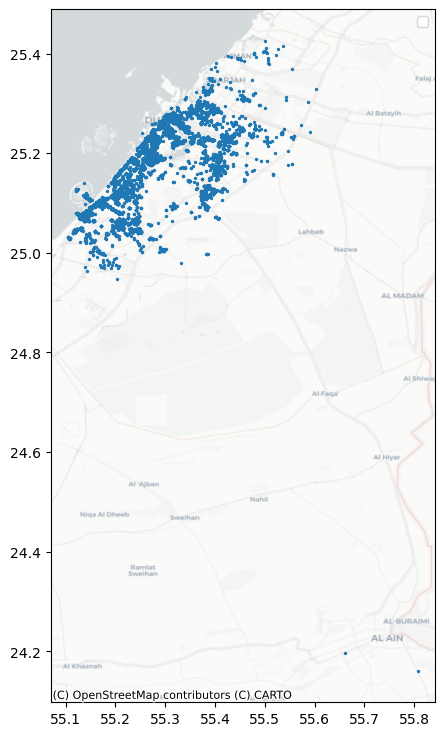

In [136]:
#optional step, add world basemap
f, ax = plt.subplots(1, figsize=(9, 9))
gdf_vendor.plot(ax=ax, markersize=2)
cx.add_basemap(ax, crs=gdf_vendor.crs, source=cx.providers.CartoDB.Positron)
plt.legend()

# Compute distance between vendors and customers

In [232]:
def shortest_road_distance(row):
    orig_node = ox.distance.nearest_nodes(G, row['vendor_lon'], row['vendor_lat'])
    dest_node = ox.distance.nearest_nodes(G, row['customer_lon'], row['customer_lat'])
    try:
        dist = nx.shortest_path_length(G, orig_node, dest_node, weight='length')
    except:
        dist = -1
        print(row)
        print('*'*20)
    return dist

import geopy.distance

def geodesic_distance(row):
    coords_1 = (row['vendor_lat'], row['vendor_lon'])
    coords_2 = (row['customer_lat'], row['customer_lon'])
    return geopy.distance.geodesic(coords_1, coords_2).km

In [236]:
df_order.head()

,account_id,order_id,country_code,order_date,order_date_utc,order_time,order_time_utc,chain_name,chain_name_arabic,main_cuisine,secondary_verticals,vertical,vertical_class,vendor_id,vendor_name,is_grocery,is_grocery_darkstore,is_tgo,vendor_location,location_id,sub_vertical,vendor_address,Is_kitchen,Is_non_food,gmv_amount_lc,gmv_amount_eur,delivery_fee_amount_lc,service_fee_amount_lc,basket_amount_lc,delivery_arrangement,delivery_birdseye_distance_m,customer_selected_location,accepted_by_vendor_at,vendor_prepared_at,picked_up_at,delivered_at,is_successful,is_incentive_applied,incentive_amount_eur,incentive_amount_lc,pickup_id,package_picked_up_rank,package_delivered_rank,is_primary,is_talabat,customer_lon,customer_lat,vendor_lon,vendor_lat,order_time_hour,delivery_duration,total_duration,geodesic_distance
0,4285647,1305786978,AE,2023-10-10,2023-10-10,2023-10-10 18:37:22,2023-10-10 18:37:22+04:00,312,312,american,NaN,food,food,15921,"312 , Al Sufouh 1",False,False,True,POINT(55.175844 25.107854),565,NaN,m97TS6GZDQJgHaXLPqYlIpsvRyQNxkqPaiYOvWjJdoE=,False,False,89.86,23.072484,9.0,2.36,78.5,TGO,NaN,POINT(55.22939 25.164577),2023-10-10 14:39:13.330322 UTC,2023-10-10 14:51:44.525067 UTC,2023-10-10 18:54:08.409000+04:00,2023-10-10 19:31:44.836000+04:00,True,NaN,NaN,NaN,249215302.0,1.0,1.0,True,True,55.229390,25.164577,55.175844,25.107854,18,37,54,8.284731
1,6623723,1304803532,AE,2023-10-10,2023-10-09,2023-10-10 01:59:24,2023-10-10 01:59:24+04:00,Bao,باو,asian,NaN,food,food,680435,Bao,False,False,True,POINT(55.509945 25.223272),3815,NaN,PsvsUBNN7jxRJMzvOOqlt6FDcE1RD2Q0O+Cm/b/FamE=,False,False,80.82,20.751371,4.0,2.82,94.0,TGO,NaN,POINT(55.519188 25.23093),2023-10-09 22:01:27.587251 UTC,2023-10-09 22:12:53.932178 UTC,2023-10-10 02:13:33.264000+04:00,2023-10-10 02:19:27.924000+04:00,True,True,5.135207,20.0,249057659.0,1.0,1.0,True,True,55.519188,25.230930,55.509945,25.223272,1,5,20,1.259796
2,532699,1305513564,AE,2023-10-10,2023-10-10,2023-10-10 14:33:24,2023-10-10 14:33:24+04:00,Bao,باو,asian,NaN,food,food,680435,Bao,False,False,True,POINT(55.509945 25.223272),3815,NaN,PsvsUBNN7jxRJMzvOOqlt6FDcE1RD2Q0O+Cm/b/FamE=,False,False,49.76,12.776395,6.5,1.26,42.0,TGO,NaN,POINT(55.42924 25.23102),2023-10-10 10:34:48.435248 UTC,2023-10-10 10:46:42.806648 UTC,2023-10-10 14:47:40.640000+04:00,2023-10-10 15:08:06.544000+04:00,True,NaN,NaN,NaN,249146893.0,1.0,1.0,True,True,55.429240,25.231020,55.509945,25.223272,14,20,34,8.177303
3,3151762,1305873227,AE,2023-10-10,2023-10-10,2023-10-10 19:34:48,2023-10-10 19:34:48+04:00,Bao,باو,asian,NaN,food,food,680435,Bao,False,False,True,POINT(55.509945 25.223272),3815,NaN,PsvsUBNN7jxRJMzvOOqlt6FDcE1RD2Q0O+Cm/b/FamE=,False,False,114.65,29.437573,6.5,3.15,105.0,TGO,NaN,POINT(55.429173 25.217012),2023-10-10 15:35:58.840766 UTC,2023-10-10 15:49:35.499143 UTC,2023-10-10 19:50:24.535000+04:00,2023-10-10 20:20:30.237000+04:00,True,NaN,NaN,NaN,249238351.0,1.0,1.0,True,True,55.429173,25.217012,55.509945,25.223272,19,30,45,8.168839
4,13769620,1305979396,AE,2023-10-10,2023-10-10,2023-10-10 20:40:52,2023-10-10 20:40:52+04:00,Bao,باو,asian,NaN,food,food,680435,Bao,False,False,True,POINT(55.509945 25.223272),3815,NaN,PsvsUBNN7jxRJMzvOOqlt6FDcE1RD2Q0O+Cm/b/FamE=,False,False,43.61,11.197319,5.5,1.11,37.0,TGO,NaN,POINT(55.513863 25.241583),2023-10-10 16:41:58.01629 UTC,2023-10-10 16:49:15.254492 UTC,2023-10-10 20:50:18.099000+04:00,2023-10-10 21:00:36.502000+04:00,True,NaN,NaN,NaN,249266619.0,1.0,1.0,True,True,55.513863,25.241583,55.509945,25.223272,20,10,19,2.066485


In [234]:
%%time
df_order['geodesic_distance'] = df_order.apply(lambda row: geodesic_distance(row), axis=1)

CPU times: user 11min 19s, sys: 29.4 s, total: 11min 48s
Wall time: 12min 2s


In [235]:
# df_order.to_csv('../data/Talabat/order_202310_processed.csv',sep=',',index=False) # this is after all processed

# OD

In [124]:
import time
import datetime
import numpy as np
import pandas as pd
import geopandas as gpd
import osmnx as ox
import matplotlib.pyplot as plt
import networkx as nx
import logging
import matplotlib.patches as patches

In [416]:
# from shapely.strtree import STRtree
!pip show shapely

Name: shapely
Version: 2.0.1
Summary: Manipulation and analysis of geometric objects
Home-page: 
Author: Sean Gillies
Author-email: 
License: BSD 3-Clause
Location: /Users/rongxiangsu/anaconda3/lib/python3.11/site-packages
Requires: numpy
Required-by: Cartopy, ellipsis, geopandas, h3pandas, keplergl, libpysal, momepy, ortega, osmnx, rasterstats, spopt


In [15]:
# vendor_address = gdf_vendor[['vendor_id','geometry']]
# print(vendor_address.shape[0])
# vendor_address.head()

In [16]:
# # get the boundary of Dubai and the nearby area
# print(gdf_deliveredlocation.geometry.x.max(), gdf_deliveredlocation.geometry.x.min())
# print(gdf_deliveredlocation.geometry.y.max(), gdf_deliveredlocation.geometry.y.min())
# print(gdf_vendor.geometry.x.max(), gdf_vendor.geometry.x.min())
# print(gdf_vendor.geometry.y.max(), gdf_vendor.geometry.y.min())
# #boundary: 26.5, 23, 56.5, 52   # north=None, south=None, east=None, west=None

56.3631318882108 52.639758
26.029922 23.6068870546676
56.3634177 52.644674882209
26.0110625 23.614483884493


In [78]:
# %%time
# #retrieve OSM driving road network of Dubai and nearby areas
G = ox.graph_from_bbox(26.6, 23, 56.6, 52, network_type='all',retain_all=True)#network_type='drive'

CPU times: user 10min 35s, sys: 4min 29s, total: 15min 4s
Wall time: 18min 28s


In [125]:
# %%time
# ox.plot.plot_graph(G)

In [43]:
# # test shortest path distance algorithm by OSMnx
# orig_node = ox.distance.nearest_nodes(G, 55.193165, 25.065180) #Art and Dine: 25.065180, 55.193165
# dest_node = ox.distance.nearest_nodes(G, 55.205489, 25.098321) #Al Barsha Mall: 25.098321, 55.205489
# nx.shortest_path_length(G, orig_node, dest_node, weight='length')

In [126]:
#retrieve all OD pairs according to Order information
# df_od = df_order[['account_id','order_id','customer_lon','customer_lat','vendor_lon','vendor_lat']]

In [127]:
# # %%time
# # df_od['distance'] = df_od.apply(lambda row: shortest_road_distance(row), axis=1)
# # df_od
# df_od['geodesic_distance'] = df_od.apply(lambda row: geodesic_distance(row), axis=1)
# df_od

In [128]:
# df_od['geodesic_distance'].hist(bins=23)
# plt.title("Distance between vendor and customer (km)") 
# df_od['geodesic_distance'].describe()

In [129]:
# df_od.geodesic_distance.describe()

In [130]:
# df_od[df_od.geodesic_distance>100]

# Hexagon

<Axes: >

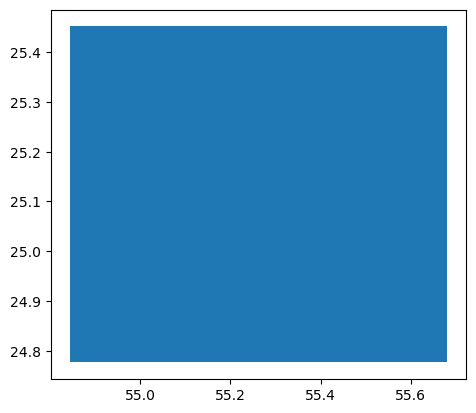

In [16]:
from shapely.geometry import box
dubai_box = gpd.GeoDataFrame(geometry=[box(bound_lon[0],bound_lat[0],bound_lon[1],bound_lat[1])],crs="EPSG:4326")
dubai_box.plot()

about size and resolution of hexagon: https://h3geo.org/docs/core-library/restable/

CPU times: user 2.61 s, sys: 717 ms, total: 3.32 s
Wall time: 4.11 s


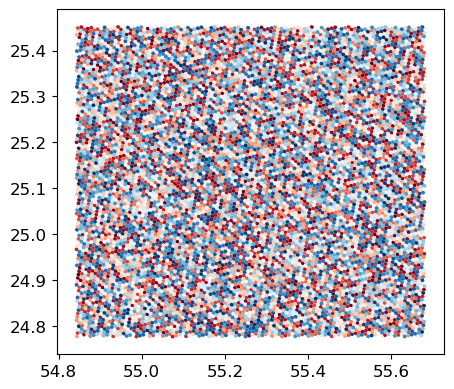

In [232]:
%%time
# create hexagon within the UAE border
import geopandas as gpd
import h3pandas

resolution = 8 # Average edge length: 500m
hexagons = dubai_box.h3.polyfill_resample(resolution)
ax = hexagons.plot(figsize=(5, 5), cmap='RdBu')

# Number of vendors within each hexagon

In [201]:
gdf_vendor['no_vendors'] = 1
print(gdf_vendor.shape[0])
no_vendors = gpd.sjoin(gdf_vendor, hexagons, op='within') 
print(no_vendors.shape[0])

9686
9684


In [202]:
hexagon_agg_vendors = no_vendors[['index_right','no_vendors']].groupby('index_right').agg('sum')
hexagon_agg_vendors = hexagon_agg_vendors[['no_vendors']]
hexagon_agg_vendors = hexagon_agg_vendors.reset_index()
hexagon_agg_vendors.head(2)

,index_right,no_vendors
0,8843a12003fffff,4
1,8843a12007fffff,12


# Number of orders by customer locations

In [34]:
%%time
from shapely.geometry import Point
from geopandas import GeoDataFrame

geometry = [Point(xy) for xy in zip(df_order.customer_lon, df_order.customer_lat)]
# df = df.drop(['Lon', 'Lat'], axis=1)
gdf_order = GeoDataFrame(df_order, crs="EPSG:4326", geometry=geometry)
print(gdf_order.shape[0])
gdf_order.head()

3615723
CPU times: user 48 s, sys: 6.52 s, total: 54.5 s
Wall time: 56.8 s


,account_id,order_id,order_date,order_time,order_time_utc,chain_name,main_cuisine,secondary_verticals,vertical,vertical_class,vendor_id,vendor_name,is_grocery,is_grocery_darkstore,vendor_location,location_id,Is_kitchen,gmv_amount_lc,gmv_amount_eur,delivery_fee_amount_lc,service_fee_amount_lc,basket_amount_lc,delivery_arrangement,customer_selected_location,accepted_by_vendor_at,vendor_prepared_at,picked_up_at,delivered_at,is_successful,is_incentive_applied,incentive_amount_eur,incentive_amount_lc,pickup_id,package_picked_up_rank,package_delivered_rank,is_primary,is_talabat,customer_lon,customer_lat,vendor_lon,vendor_lat,order_time_hour,delivery_duration,total_duration,geodesic_distance,index_destination,modularity_class_destination,index_origin,modularity_class_origin,geometry
0,4285647,1305786978,2023-10-10,2023-10-10 18:37:22,2023-10-10 18:37:22+04:00,312,american,NaN,food,food,15921,"312 , Al Sufouh 1",False,False,POINT(55.175844 25.107854),565,False,89.86,23.072484,9.0,2.36,78.5,TGO,POINT(55.22939 25.164577),2023-10-10 14:39:13.330322 UTC,2023-10-10 14:51:44.525067 UTC,2023-10-10 18:54:08.409000+04:00,2023-10-10 19:31:44.836000+04:00,True,NaN,NaN,NaN,249215302.0,1.0,1.0,True,True,55.229390,25.164577,55.175844,25.107854,18,37,54,8.284731,8843a13449fffff,3,8843a130ddfffff,0,POINT (55.22939 25.16458)
1,6623723,1304803532,2023-10-10,2023-10-10 01:59:24,2023-10-10 01:59:24+04:00,Bao,asian,NaN,food,food,680435,Bao,False,False,POINT(55.509945 25.223272),3815,False,80.82,20.751371,4.0,2.82,94.0,TGO,POINT(55.519188 25.23093),2023-10-09 22:01:27.587251 UTC,2023-10-09 22:12:53.932178 UTC,2023-10-10 02:13:33.264000+04:00,2023-10-10 02:19:27.924000+04:00,True,True,5.135207,20.0,249057659.0,1.0,1.0,True,True,55.519188,25.230930,55.509945,25.223272,1,5,20,1.259796,8843ac52cdfffff,4,8843ac5211fffff,4,POINT (55.51919 25.23093)
2,532699,1305513564,2023-10-10,2023-10-10 14:33:24,2023-10-10 14:33:24+04:00,Bao,asian,NaN,food,food,680435,Bao,False,False,POINT(55.509945 25.223272),3815,False,49.76,12.776395,6.5,1.26,42.0,TGO,POINT(55.42924 25.23102),2023-10-10 10:34:48.435248 UTC,2023-10-10 10:46:42.806648 UTC,2023-10-10 14:47:40.640000+04:00,2023-10-10 15:08:06.544000+04:00,True,NaN,NaN,NaN,249146893.0,1.0,1.0,True,True,55.429240,25.231020,55.509945,25.223272,14,20,34,8.177303,8843acc8e5fffff,4,8843ac5211fffff,4,POINT (55.42924 25.23102)
3,3151762,1305873227,2023-10-10,2023-10-10 19:34:48,2023-10-10 19:34:48+04:00,Bao,asian,NaN,food,food,680435,Bao,False,False,POINT(55.509945 25.223272),3815,False,114.65,29.437573,6.5,3.15,105.0,TGO,POINT(55.429173 25.217012),2023-10-10 15:35:58.840766 UTC,2023-10-10 15:49:35.499143 UTC,2023-10-10 19:50:24.535000+04:00,2023-10-10 20:20:30.237000+04:00,True,NaN,NaN,NaN,249238351.0,1.0,1.0,True,True,55.429173,25.217012,55.509945,25.223272,19,30,45,8.168839,8843acc9d1fffff,4,8843ac5211fffff,4,POINT (55.42917 25.21701)
4,13769620,1305979396,2023-10-10,2023-10-10 20:40:52,2023-10-10 20:40:52+04:00,Bao,asian,NaN,food,food,680435,Bao,False,False,POINT(55.509945 25.223272),3815,False,43.61,11.197319,5.5,1.11,37.0,TGO,POINT(55.513863 25.241583),2023-10-10 16:41:58.01629 UTC,2023-10-10 16:49:15.254492 UTC,2023-10-10 20:50:18.099000+04:00,2023-10-10 21:00:36.502000+04:00,True,NaN,NaN,NaN,249266619.0,1.0,1.0,True,True,55.513863,25.241583,55.509945,25.223272,20,10,19,2.066485,8843accd23fffff,4,8843ac5211fffff,4,POINT (55.51386 25.24158)


count    3615723.000000
mean     4.149359      
std      3.330185      
min      0.000000      
25%      1.573293      
50%      3.262836      
75%      5.889728      
max      35.891104     
Name: geodesic_distance, dtype: object


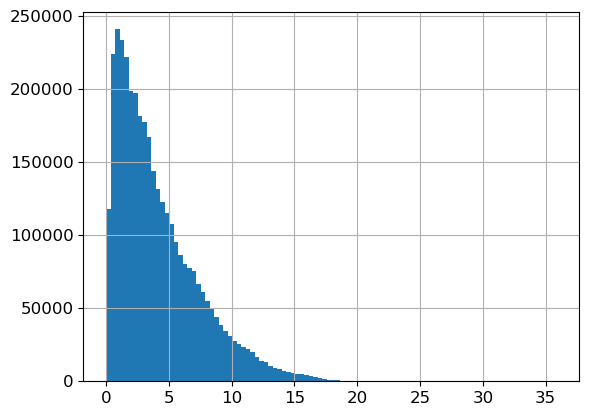

In [385]:
gdf_order.geodesic_distance.hist(bins=100)
print(gdf_order.geodesic_distance.describe().apply(lambda x: format(x, 'f')))

In [35]:
%%time
gdf_order['count'] = 1
pointInPoly = gpd.sjoin(gdf_order, hexagons, op='within') # customer location - hexagon
print(pointInPoly.shape[0])

3615723
CPU times: user 34.9 s, sys: 17 s, total: 51.9 s
Wall time: 56.4 s


In [36]:
pointInPoly.head(2)

,account_id,order_id,order_date,order_time,order_time_utc,chain_name,main_cuisine,secondary_verticals,vertical,vertical_class,vendor_id,vendor_name,is_grocery,is_grocery_darkstore,vendor_location,location_id,Is_kitchen,gmv_amount_lc,gmv_amount_eur,delivery_fee_amount_lc,service_fee_amount_lc,basket_amount_lc,delivery_arrangement,customer_selected_location,accepted_by_vendor_at,vendor_prepared_at,picked_up_at,delivered_at,is_successful,is_incentive_applied,incentive_amount_eur,incentive_amount_lc,pickup_id,package_picked_up_rank,package_delivered_rank,is_primary,is_talabat,customer_lon,customer_lat,vendor_lon,vendor_lat,order_time_hour,delivery_duration,total_duration,geodesic_distance,index_destination,modularity_class_destination,index_origin,modularity_class_origin,geometry,count,index_right,index
0,4285647,1305786978,2023-10-10,2023-10-10 18:37:22,2023-10-10 18:37:22+04:00,312,american,NaN,food,food,15921,"312 , Al Sufouh 1",False,False,POINT(55.175844 25.107854),565,False,89.86,23.072484,9.0,2.36,78.5,TGO,POINT(55.22939 25.164577),2023-10-10 14:39:13.330322 UTC,2023-10-10 14:51:44.525067 UTC,2023-10-10 18:54:08.409000+04:00,2023-10-10 19:31:44.836000+04:00,True,NaN,NaN,NaN,249215302.0,1.0,1.0,True,True,55.22939,25.164577,55.175844,25.107854,18,37,54,8.284731,8843a13449fffff,3,8843a130ddfffff,0,POINT (55.22939 25.16458),1,8843a13449fffff,0
119,1432335,1305620964,2023-10-10,2023-10-10 16:10:21,2023-10-10 16:10:21+04:00,Grow,healthy,NaN,food,food,696799,"Grow, Dubai Healthcare City",False,False,POINT(55.3182659 25.233901),601,False,47.11,12.095980,9.0,1.11,37.0,TGO,POINT(55.23045 25.165579),2023-10-10 12:11:52.800968 UTC,2023-10-10 12:17:49.549393 UTC,2023-10-10 16:20:47.112000+04:00,2023-10-10 16:45:51.492000+04:00,True,NaN,NaN,NaN,249172915.0,1.0,1.0,True,True,55.23045,25.165579,55.318266,25.233901,16,25,35,11.645380,8843a13449fffff,3,8843accb55fffff,3,POINT (55.23045 25.16558),1,8843a13449fffff,0


optional step

1908
CPU times: user 1.22 s, sys: 187 ms, total: 1.4 s
Wall time: 1.21 s


Text(0.5, 1.0, 'Number of orders by customer locations')

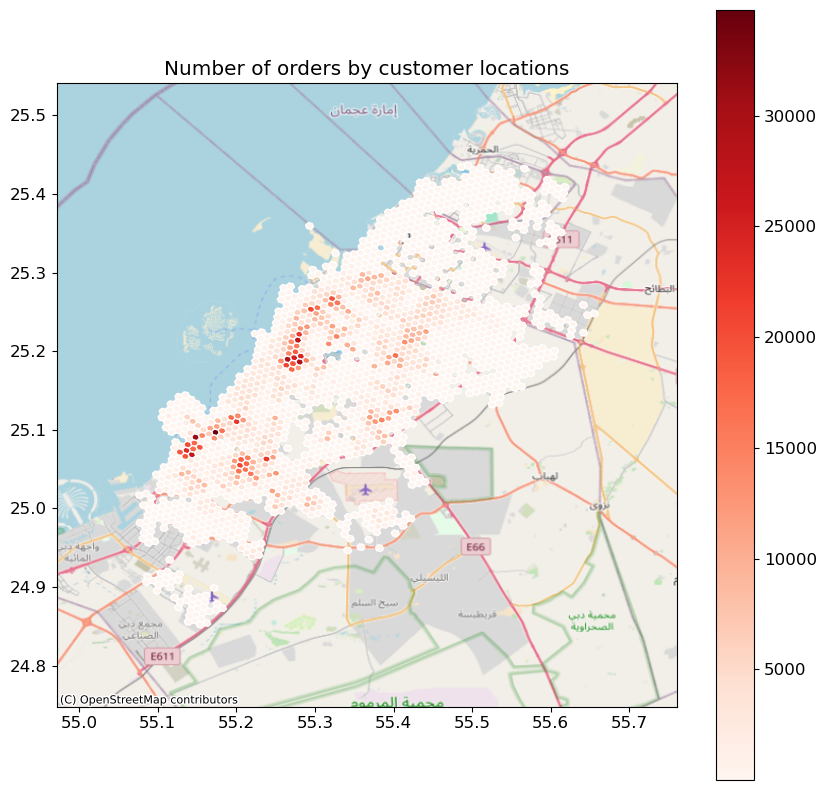

In [267]:
%%time
hexagon_agg = pointInPoly[['index_right','count']].groupby('index_right').agg('sum')
hexagon_agg = hexagon_agg[['count']]

hexagon_agg_ordernumber = hexagons.merge(hexagon_agg,left_index=True,right_index=True) # focus on hexagons that contains delivery data
# print(hexagon_agg_ordernumber.crs)  #EPSG:4326: WGS84
print(hexagon_agg_ordernumber.shape[0])
ax = hexagon_agg_ordernumber.plot(figsize=(10, 10), cmap='Reds',column='count',legend=True,edgecolor='white')
xmin, ymin, xmax, ymax = hexagon_agg_ordernumber.total_bounds
pad = 0.1  # add a padding around the geometry
ax.set_xlim(xmin-pad, xmax+pad)
ax.set_ylim(ymin-pad, ymax+pad)
cx.add_basemap(ax, crs=hexagon_agg_ordernumber.crs, source=cx.providers.OpenStreetMap.Mapnik)
plt.title('Number of orders by customer locations')

Show a specifc attribute

1908
CPU times: user 1.22 s, sys: 206 ms, total: 1.43 s
Wall time: 1.26 s


Text(0.5, 1.0, 'Mean order trip distance (km)')

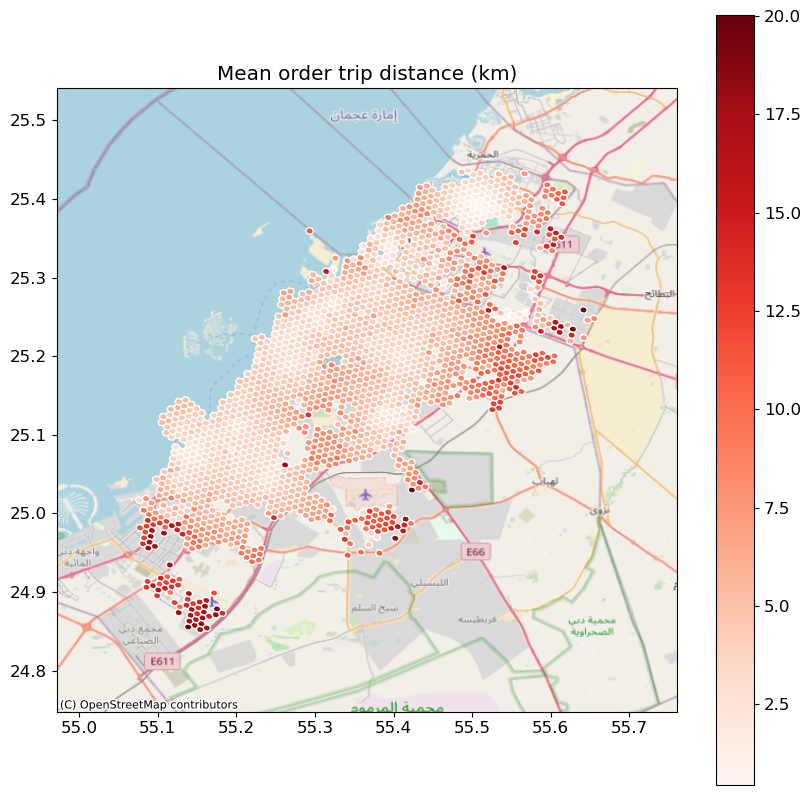

In [270]:
%%time
select_attr = 'geodesic_distance'#total_duration
hexagon_agg3 = pointInPoly[['index_right',select_attr]].groupby('index_right').agg('mean')

hexagon_agg_attribute = hexagons.merge(hexagon_agg3[[select_attr]],left_index=True,right_index=True) # focus on hexagons that contains delivery data
print(hexagon_agg_attribute.shape[0])
ax = hexagon_agg_attribute.plot(figsize=(10, 10), cmap='Reds',column=select_attr,legend=True,edgecolor='white')
xmin, ymin, xmax, ymax = hexagon_agg_attribute.total_bounds
pad = 0.1  # add a padding around the geometry
ax.set_xlim(xmin-pad, xmax+pad)
ax.set_ylim(ymin-pad, ymax+pad)
cx.add_basemap(ax, crs=hexagon_agg_attribute.crs, source=cx.providers.OpenStreetMap.Mapnik)
plt.title('Mean order trip distance (km)')

1908
CPU times: user 1.28 s, sys: 178 ms, total: 1.46 s
Wall time: 1.25 s


Text(0.5, 1.0, 'total_duration')

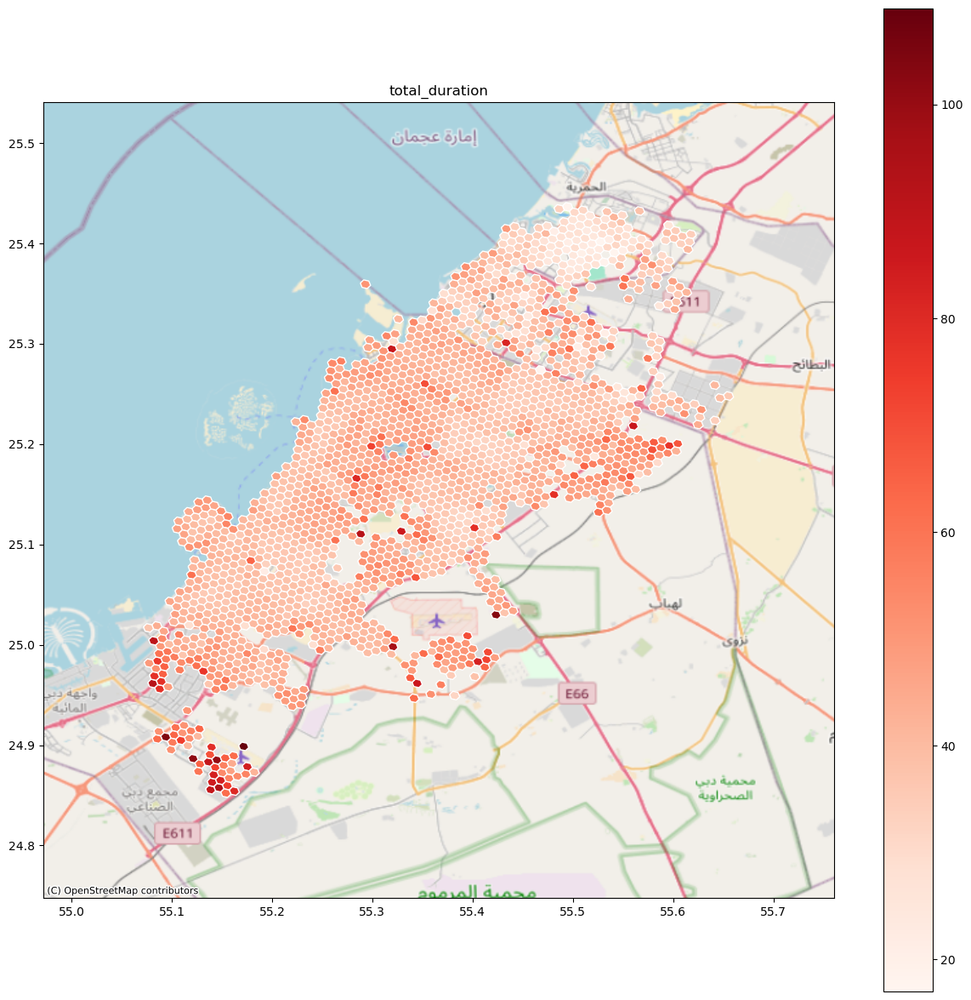

In [247]:
%%time
select_attr = 'total_duration'
hexagon_agg3 = pointInPoly[['index_right',select_attr]].groupby('index_right').agg('mean')

hexagon_agg_attribute = hexagons.merge(hexagon_agg3[[select_attr]],left_index=True,right_index=True) # focus on hexagons that contains delivery data
print(hexagon_agg_attribute.shape[0])
ax = hexagon_agg_attribute.plot(figsize=(10, 10), cmap='Reds',column=select_attr,legend=True,edgecolor='white')
xmin, ymin, xmax, ymax = hexagon_agg_attribute.total_bounds
pad = 0.1  # add a padding around the geometry
ax.set_xlim(xmin-pad, xmax+pad)
ax.set_ylim(ymin-pad, ymax+pad)
cx.add_basemap(ax, crs=hexagon_agg_attribute.crs, source=cx.providers.OpenStreetMap.Mapnik)
plt.title(select_attr)

# Number of orders by vendor locations

In [42]:
%%time
gdf_order_vendor = gdf_order
gdf_order_vendor['geometry'] = gpd.GeoSeries.from_wkt(gdf_order_vendor['vendor_location'])
gdf_order_vendor = gpd.GeoDataFrame(gdf_order_vendor, crs="EPSG:4326",  geometry='geometry')
print(gdf_order_vendor.shape[0])
gdf_order_vendor.head()

3615723
CPU times: user 5.52 s, sys: 923 ms, total: 6.45 s
Wall time: 6.8 s


,account_id,order_id,order_date,order_time,order_time_utc,chain_name,main_cuisine,secondary_verticals,vertical,vertical_class,vendor_id,vendor_name,is_grocery,is_grocery_darkstore,vendor_location,location_id,Is_kitchen,gmv_amount_lc,gmv_amount_eur,delivery_fee_amount_lc,service_fee_amount_lc,basket_amount_lc,delivery_arrangement,customer_selected_location,accepted_by_vendor_at,vendor_prepared_at,picked_up_at,delivered_at,is_successful,is_incentive_applied,incentive_amount_eur,incentive_amount_lc,pickup_id,package_picked_up_rank,package_delivered_rank,is_primary,is_talabat,customer_lon,customer_lat,vendor_lon,vendor_lat,order_time_hour,delivery_duration,total_duration,geodesic_distance,index_destination,modularity_class_destination,index_origin,modularity_class_origin,geometry,count
0,4285647,1305786978,2023-10-10,2023-10-10 18:37:22,2023-10-10 18:37:22+04:00,312,american,NaN,food,food,15921,"312 , Al Sufouh 1",False,False,POINT(55.175844 25.107854),565,False,89.86,23.072484,9.0,2.36,78.5,TGO,POINT(55.22939 25.164577),2023-10-10 14:39:13.330322 UTC,2023-10-10 14:51:44.525067 UTC,2023-10-10 18:54:08.409000+04:00,2023-10-10 19:31:44.836000+04:00,True,NaN,NaN,NaN,249215302.0,1.0,1.0,True,True,55.229390,25.164577,55.175844,25.107854,18,37,54,8.284731,8843a13449fffff,3,8843a130ddfffff,0,POINT (55.17584 25.10785),1
1,6623723,1304803532,2023-10-10,2023-10-10 01:59:24,2023-10-10 01:59:24+04:00,Bao,asian,NaN,food,food,680435,Bao,False,False,POINT(55.509945 25.223272),3815,False,80.82,20.751371,4.0,2.82,94.0,TGO,POINT(55.519188 25.23093),2023-10-09 22:01:27.587251 UTC,2023-10-09 22:12:53.932178 UTC,2023-10-10 02:13:33.264000+04:00,2023-10-10 02:19:27.924000+04:00,True,True,5.135207,20.0,249057659.0,1.0,1.0,True,True,55.519188,25.230930,55.509945,25.223272,1,5,20,1.259796,8843ac52cdfffff,4,8843ac5211fffff,4,POINT (55.50995 25.22327),1
2,532699,1305513564,2023-10-10,2023-10-10 14:33:24,2023-10-10 14:33:24+04:00,Bao,asian,NaN,food,food,680435,Bao,False,False,POINT(55.509945 25.223272),3815,False,49.76,12.776395,6.5,1.26,42.0,TGO,POINT(55.42924 25.23102),2023-10-10 10:34:48.435248 UTC,2023-10-10 10:46:42.806648 UTC,2023-10-10 14:47:40.640000+04:00,2023-10-10 15:08:06.544000+04:00,True,NaN,NaN,NaN,249146893.0,1.0,1.0,True,True,55.429240,25.231020,55.509945,25.223272,14,20,34,8.177303,8843acc8e5fffff,4,8843ac5211fffff,4,POINT (55.50995 25.22327),1
3,3151762,1305873227,2023-10-10,2023-10-10 19:34:48,2023-10-10 19:34:48+04:00,Bao,asian,NaN,food,food,680435,Bao,False,False,POINT(55.509945 25.223272),3815,False,114.65,29.437573,6.5,3.15,105.0,TGO,POINT(55.429173 25.217012),2023-10-10 15:35:58.840766 UTC,2023-10-10 15:49:35.499143 UTC,2023-10-10 19:50:24.535000+04:00,2023-10-10 20:20:30.237000+04:00,True,NaN,NaN,NaN,249238351.0,1.0,1.0,True,True,55.429173,25.217012,55.509945,25.223272,19,30,45,8.168839,8843acc9d1fffff,4,8843ac5211fffff,4,POINT (55.50995 25.22327),1
4,13769620,1305979396,2023-10-10,2023-10-10 20:40:52,2023-10-10 20:40:52+04:00,Bao,asian,NaN,food,food,680435,Bao,False,False,POINT(55.509945 25.223272),3815,False,43.61,11.197319,5.5,1.11,37.0,TGO,POINT(55.513863 25.241583),2023-10-10 16:41:58.01629 UTC,2023-10-10 16:49:15.254492 UTC,2023-10-10 20:50:18.099000+04:00,2023-10-10 21:00:36.502000+04:00,True,NaN,NaN,NaN,249266619.0,1.0,1.0,True,True,55.513863,25.241583,55.509945,25.223272,20,10,19,2.066485,8843accd23fffff,4,8843ac5211fffff,4,POINT (55.50995 25.22327),1


In [43]:
gdf_order_vendor['count'] = 1
pointInPoly2 = gpd.sjoin(gdf_order_vendor, hexagons, op='within') # vendor location - hexagon
print(pointInPoly2.shape[0])

3615723


optional step

698
CPU times: user 1.02 s, sys: 214 ms, total: 1.23 s
Wall time: 1.07 s


Text(0.5, 1.0, 'Number of orders by vendor locations')

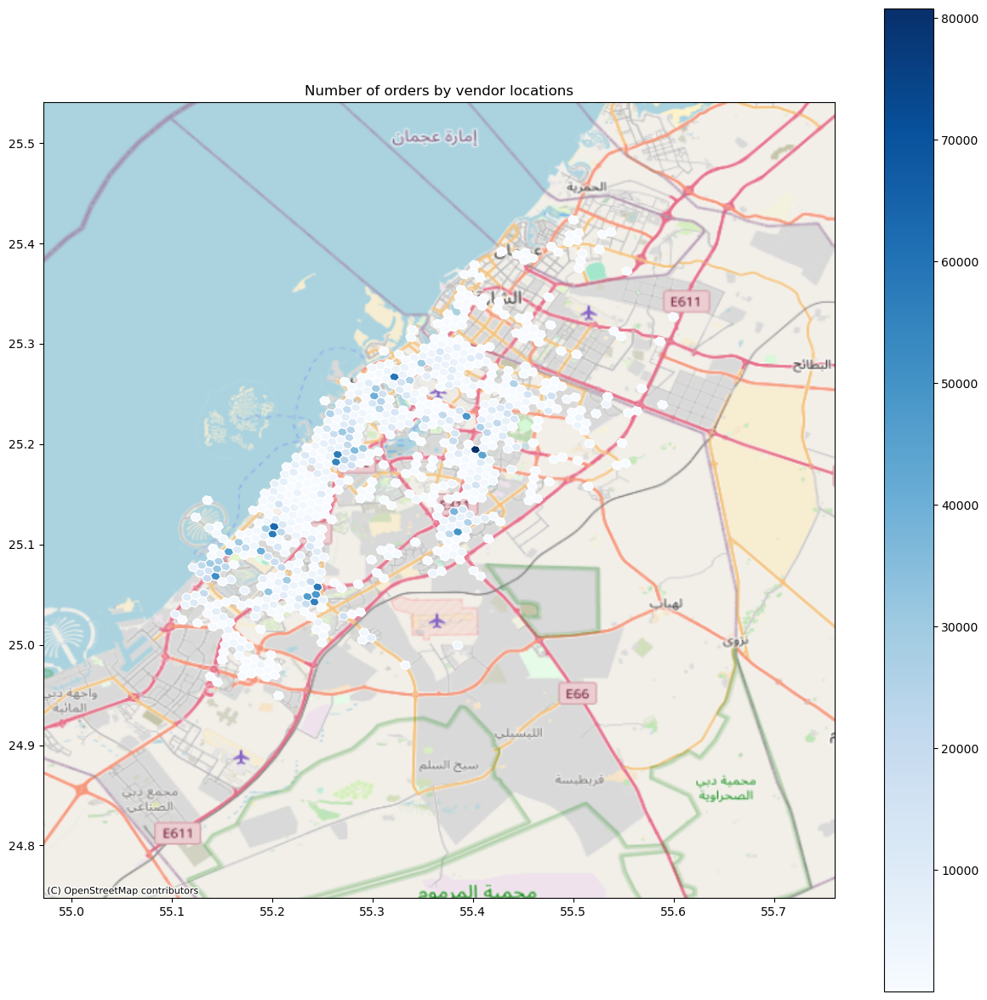

In [44]:
%%time
hexagon_agg2 = pointInPoly2[['index_right','count']].groupby('index_right').agg('sum')
hexagon_agg2 = hexagon_agg2[['count']]

hexagon_agg_ordernumber2 = hexagons.merge(hexagon_agg2,left_index=True,right_index=True) # focus on hexagons that contains delivery data
print(hexagon_agg_ordernumber2.shape[0])
# print(hexagon_agg_ordernumber2.crs)  #EPSG:4326: WGS84
ax = hexagon_agg_ordernumber2.plot(figsize=(10, 10), cmap='Blues',column='count',legend=True, edgecolor='white')
ax.set_xlim(xmin-pad, xmax+pad)
ax.set_ylim(ymin-pad, ymax+pad)
cx.add_basemap(ax, crs=hexagon_agg_ordernumber2.crs, source=cx.providers.OpenStreetMap.Mapnik)
plt.title('Number of orders by vendor locations')

# Community detection

In [224]:
order_o = pointInPoly2[['order_id','index_right','count']]  # vendor locations as O
order_d = pointInPoly[['order_id','index_right']] # customer locations as D
order_o = order_o.rename(columns={"index_right": "origin",'count':'Weight'})
order_d = order_d.rename(columns={"index_right": "destination"})
order_merged = order_o.merge(order_d)
print(order_merged.shape[0])
order_merged = order_merged[['origin','destination','Weight']].groupby(['origin','destination']).sum().reset_index()
# order_merged.to_csv('od.csv',sep=',',index=False,header=None)
print('No. of origins (vendors):',order_merged.origin.unique().shape[0])
print('No. of destinations (customers):',order_merged.destination.unique().shape[0])

3615723
No. of origins (vendors): 698
No. of destinations (customers) 1908


In [222]:
import networkx as nx
G = nx.from_pandas_edgelist(order_merged, source='origin', target='destination', edge_attr='Weight', create_using=nx.DiGraph())

In [223]:
nx.write_gexf(G, "od_complete_202310.gexf")

this graph (od.gexf) is then used as input into Gephi to run Modularity community detection, the output of this is community.csv

- Copy 'weight' to weight column in Edge table (in Gephi's data laboratory)
- Run modularity
- export Node table

In [242]:
community = pd.read_csv('./community_202310.csv', sep=',', header=0)
community = community.drop(['Label'], axis=1)

In [243]:
print('total number of communities:',community.modularity_class.unique().shape[0])
print('total number of hexagons:',community.shape[0])
community.head(2)

total number of communities: 8
total number of hexagons: 1915


,Id,modularity_class
0,8843a12003fffff,0
1,8843a12001fffff,0


In [244]:
community.modularity_class.value_counts(normalize=True).round(2).sort_values(ascending=False)

modularity_class
0    0.24
4    0.19
6    0.13
3    0.12
1    0.11
2    0.08
7    0.07
5    0.06
Name: proportion, dtype: float64

In [245]:
union_df = pd.concat([hexagon_agg_ordernumber[['geometry']], hexagon_agg_ordernumber2[['geometry']]]) # these are hexagons containing OD delivery data
union_df.drop_duplicates(keep='last', inplace=True) 
print(union_df.shape[0])
union_df = union_df.merge(community,left_index=True,right_on='Id')  # including both vendor and customer locations

1915


In [262]:
points_lon = [55.277277, 55.267376, 55.134238, 55.326416, 55.324171, 55.304344]
pints_lat = [25.210324, 25.186358, 25.077899, 25.215794, 25.274381, 25.256552] 
neighbor_list = ['DIFC (dense, high income)','Business Bay (dense, high income)', 'Jumeirah Beach Residence (dense, high income)', 
                'Al Jaddaf (dense, middle class, recently established)', 'Deira South (dense, low income)',
                'Bur Dubai (dense, low income)']
type = [1, 1, 1, 1, 2, 2]
df_selected_neiborhood = pd.DataFrame(list(zip(neighbor_list,pints_lat,points_lon,type)),
                           columns=["neighborhood", "lat","lon","type"])

geometry = [Point(xy) for xy in zip(df_selected_neiborhood.lon, df_selected_neiborhood.lat)]
df_selected_neiborhood = GeoDataFrame(df_selected_neiborhood, crs="EPSG:4326", geometry=geometry)
df_selected_neiborhood

,neighborhood,lat,lon,type,geometry
0,"DIFC (dense, high income)",25.210324,55.277277,1,POINT (55.27728 25.21032)
1,"Business Bay (dense, high income)",25.186358,55.267376,1,POINT (55.26738 25.18636)
2,"Jumeirah Beach Residence (dense, high income)",25.077899,55.134238,1,POINT (55.13424 25.07790)
3,"Al Jaddaf (dense, middle class, recently established)",25.215794,55.326416,1,POINT (55.32642 25.21579)
4,"Deira South (dense, low income)",25.274381,55.324171,2,POINT (55.32417 25.27438)
5,"Bur Dubai (dense, low income)",25.256552,55.304344,2,POINT (55.30434 25.25655)


In [412]:
union_df.explore(
    column='modularity_class',  # make choropleth based on "BoroName" column
    tooltip='modularity_class',  # show "BoroName" value in tooltip (on hover)
    popup=True,  # show all values in popup (on click)
    tiles="OpenStreetMap",  # use "CartoDB positron" tiles
    cmap="tab10",  # use "Set1" matplotlib colormap
    categorical=True,
    style_kwds=dict(color="gray",weight='0.1',fillOpacity=0.8) 
)

In [402]:
m = union_df.explore(
    column='modularity_class',  # make choropleth based on "BoroName" column
    tooltip='modularity_class',  # show "BoroName" value in tooltip (on hover)
    popup=True,  # show all values in popup (on click)
    tiles="OpenStreetMap",  # use "CartoDB positron" tiles
    cmap="tab10",  # use "Set1" matplotlib colormap
    categorical=True,
    style_kwds=dict(color="gray",weight='0.1',fillOpacity=0.8) 
)

df_selected_neiborhood.explore(
    m=m, 
    column='type',
    cmap="bwr", 
    categorical=True,
    marker_kwds=dict(radius=5, fill=True))


In [411]:
df_selected_neiborhood.loc[df_selected_neiborhood['type'] == 1, 'type'] = 'High income'
df_selected_neiborhood.loc[df_selected_neiborhood['type'] == 2, 'type'] = 'Low income'

df_selected_neiborhood.explore(
    column='type',
    cmap="bwr", 
    categorical=True,
    marker_kwds=dict(radius=5, fill=True))

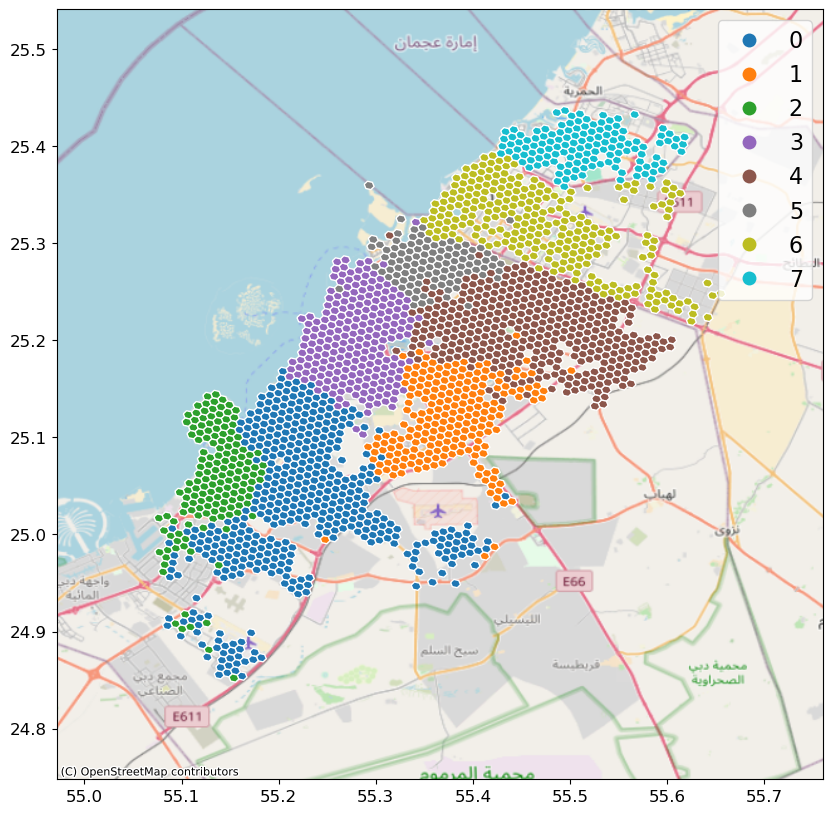

In [251]:
# print(union_df.crs)  #EPSG:4326: WGS84
ax = union_df.plot(figsize=(10, 10), categorical=True, cmap='tab10',column='modularity_class',edgecolor='white',legend=True,legend_kwds={'fontsize':16})
ax.set_xlim(xmin-pad, xmax+pad)
ax.set_ylim(ymin-pad, ymax+pad)
cx.add_basemap(ax, crs=union_df.crs, source=cx.providers.OpenStreetMap.Mapnik)
# ax.tick_params(labelsize=20)

In [297]:
customer_hexagon = pointInPoly[['order_id','index_right']]
customer_hexagon = customer_hexagon.rename(columns={"index_right": "index_destination"})
customer_hexagon = customer_hexagon.merge(community,left_on='index_destination',right_on='Id')
customer_hexagon = customer_hexagon.drop(['Id'], axis=1)
customer_hexagon = customer_hexagon.rename(columns={"modularity_class": "modularity_class_destination"})

vendor_hexagon = pointInPoly2[['order_id','index_right']]
vendor_hexagon = vendor_hexagon.rename(columns={"index_right": "index_origin"})
vendor_hexagon = vendor_hexagon.merge(community,left_on='index_origin',right_on='Id')
vendor_hexagon = vendor_hexagon.drop(['Id'], axis=1)
vendor_hexagon = vendor_hexagon.rename(columns={"modularity_class": "modularity_class_origin"})

In [301]:
print(customer_hexagon.shape[0],vendor_hexagon.shape[0])

3617110 3615723


In [299]:
df_order = df_order.merge(customer_hexagon, on='order_id')
df_order = df_order.merge(vendor_hexagon, on='order_id')
df_order.head(3)

,account_id,order_id,country_code,order_date,order_date_utc,order_time,order_time_utc,chain_name,chain_name_arabic,main_cuisine,secondary_verticals,vertical,vertical_class,vendor_id,vendor_name,is_grocery,is_grocery_darkstore,is_tgo,vendor_location,location_id,sub_vertical,vendor_address,Is_kitchen,Is_non_food,gmv_amount_lc,gmv_amount_eur,delivery_fee_amount_lc,service_fee_amount_lc,basket_amount_lc,delivery_arrangement,delivery_birdseye_distance_m,customer_selected_location,accepted_by_vendor_at,vendor_prepared_at,picked_up_at,delivered_at,is_successful,is_incentive_applied,incentive_amount_eur,incentive_amount_lc,pickup_id,package_picked_up_rank,package_delivered_rank,is_primary,is_talabat,customer_lon,customer_lat,vendor_lon,vendor_lat,order_time_hour,delivery_duration,total_duration,geodesic_distance,index_destination,modularity_class_destination,index_origin,modularity_class_origin
0,4285647,1305786978,AE,2023-10-10,2023-10-10,2023-10-10 18:37:22,2023-10-10 18:37:22+04:00,312,312,american,NaN,food,food,15921,"312 , Al Sufouh 1",False,False,True,POINT(55.175844 25.107854),565,NaN,m97TS6GZDQJgHaXLPqYlIpsvRyQNxkqPaiYOvWjJdoE=,False,False,89.86,23.072484,9.0,2.36,78.5,TGO,NaN,POINT(55.22939 25.164577),2023-10-10 14:39:13.330322 UTC,2023-10-10 14:51:44.525067 UTC,2023-10-10 18:54:08.409000+04:00,2023-10-10 19:31:44.836000+04:00,True,NaN,NaN,NaN,249215302.0,1.0,1.0,True,True,55.229390,25.164577,55.175844,25.107854,18,37,54,8.284731,8843a13449fffff,3,8843a130ddfffff,0
1,6623723,1304803532,AE,2023-10-10,2023-10-09,2023-10-10 01:59:24,2023-10-10 01:59:24+04:00,Bao,باو,asian,NaN,food,food,680435,Bao,False,False,True,POINT(55.509945 25.223272),3815,NaN,PsvsUBNN7jxRJMzvOOqlt6FDcE1RD2Q0O+Cm/b/FamE=,False,False,80.82,20.751371,4.0,2.82,94.0,TGO,NaN,POINT(55.519188 25.23093),2023-10-09 22:01:27.587251 UTC,2023-10-09 22:12:53.932178 UTC,2023-10-10 02:13:33.264000+04:00,2023-10-10 02:19:27.924000+04:00,True,True,5.135207,20.0,249057659.0,1.0,1.0,True,True,55.519188,25.230930,55.509945,25.223272,1,5,20,1.259796,8843ac52cdfffff,4,8843ac5211fffff,4
2,532699,1305513564,AE,2023-10-10,2023-10-10,2023-10-10 14:33:24,2023-10-10 14:33:24+04:00,Bao,باو,asian,NaN,food,food,680435,Bao,False,False,True,POINT(55.509945 25.223272),3815,NaN,PsvsUBNN7jxRJMzvOOqlt6FDcE1RD2Q0O+Cm/b/FamE=,False,False,49.76,12.776395,6.5,1.26,42.0,TGO,NaN,POINT(55.42924 25.23102),2023-10-10 10:34:48.435248 UTC,2023-10-10 10:46:42.806648 UTC,2023-10-10 14:47:40.640000+04:00,2023-10-10 15:08:06.544000+04:00,True,NaN,NaN,NaN,249146893.0,1.0,1.0,True,True,55.429240,25.231020,55.509945,25.223272,14,20,34,8.177303,8843acc8e5fffff,4,8843ac5211fffff,4


In [346]:
# df_order = df_order.drop(['country_code','order_date_utc','chain_name_arabic','is_tgo','sub_vertical','vendor_address','Is_non_food','delivery_birdseye_distance_m'], axis=1)

In [347]:
# %%time
# df_order.to_csv('../data/Talabat/order_202310_processed_w_hexagon.csv',sep=',',index=False) 
# this is after all processed and with hexagon info

CPU times: user 3min 30s, sys: 5.25 s, total: 3min 35s
Wall time: 3min 39s


In [2]:
%%time
df_order = pd.read_csv('../data/Talabat/order_202310_processed_w_hexagon.csv', sep=',', header=0)

CPU times: user 41.9 s, sys: 8.27 s, total: 50.1 s
Wall time: 51.7 s


In [6]:
df_ordercount_bycomm = df_order.groupby(['modularity_class_origin', 'modularity_class_destination']).size().to_frame('count').reset_index()
df_ordercount_bycomm.head(2)

,modularity_class_origin,modularity_class_destination,count
0,0,0,884193
1,0,1,18226


In [202]:
df_ordercount_bycomm_pivot = df_ordercount_bycomm.pivot(index='modularity_class_origin', columns='modularity_class_destination', values='count')
df_ordercount_bycomm_pivot = df_ordercount_bycomm_pivot.fillna(0)
df_ordercount_bycomm_pivot

modularity_class_destination,0,1,2,3,4,5,6,7
modularity_class_origin,,,,,,,,
0,884193.0,18226.0,91745.0,50834.0,123.0,153.0,0.0,0.0
1,4353.0,254357.0,4.0,5920.0,30111.0,685.0,0.0,0.0
2,93800.0,35.0,297111.0,2401.0,11.0,17.0,0.0,0.0
3,48209.0,7369.0,2770.0,736475.0,33780.0,56542.0,3.0,0.0
4,165.0,47858.0,25.0,36492.0,516405.0,55548.0,2.0,0.0
5,382.0,2375.0,48.0,44493.0,54292.0,235137.0,32.0,0.0
6,32.0,0.0,1.0,11.0,6.0,102.0,1615.0,0.0
7,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1474.0


In [204]:
nor_df_ordercount_bycomm_pivot = df_ordercount_bycomm_pivot.div(df_ordercount_bycomm_pivot.sum(axis=0), axis=1)
nor_df_ordercount_bycomm_pivot

modularity_class_destination,0,1,2,3,4,5,6,7
modularity_class_origin,,,,,,,,
0,0.857496,0.055194,0.234220,0.057988,0.000194,0.000439,0.000000,0.0
1,0.004222,0.770265,0.000010,0.006753,0.047439,0.001967,0.000000,0.0
2,0.090968,0.000106,0.758509,0.002739,0.000017,0.000049,0.000000,0.0
3,0.046753,0.022315,0.007072,0.840125,0.053220,0.162391,0.001815,0.0
4,0.000160,0.144928,0.000064,0.041628,0.813585,0.159536,0.001210,0.0
5,0.000370,0.007192,0.000123,0.050755,0.085536,0.675324,0.019359,0.0
6,0.000031,0.000000,0.000003,0.000013,0.000009,0.000293,0.977011,0.0
7,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000605,1.0


<Axes: xlabel='modularity_class_destination', ylabel='modularity_class_origin'>

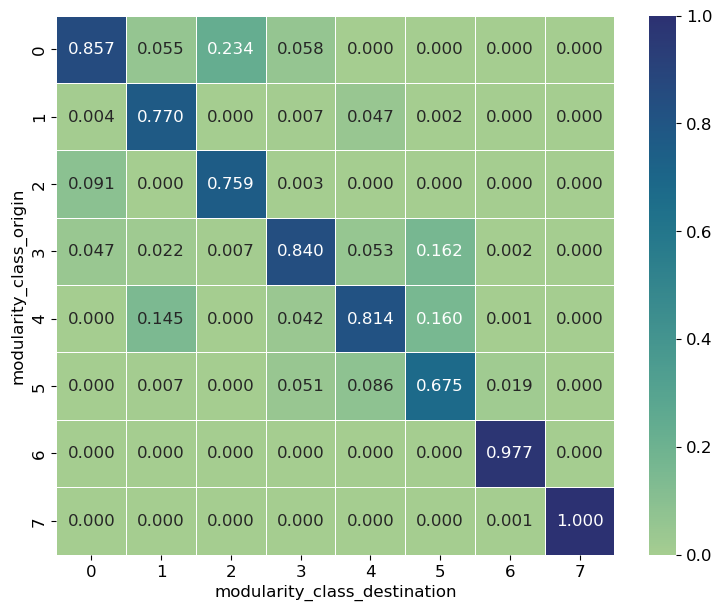

In [205]:
f, ax = plt.subplots(1, figsize=(9,7))
sns.heatmap(nor_df_ordercount_bycomm_pivot, annot=True, fmt=".3f",linewidth=.5,cmap="crest")

# Boxplot of number of orders by community

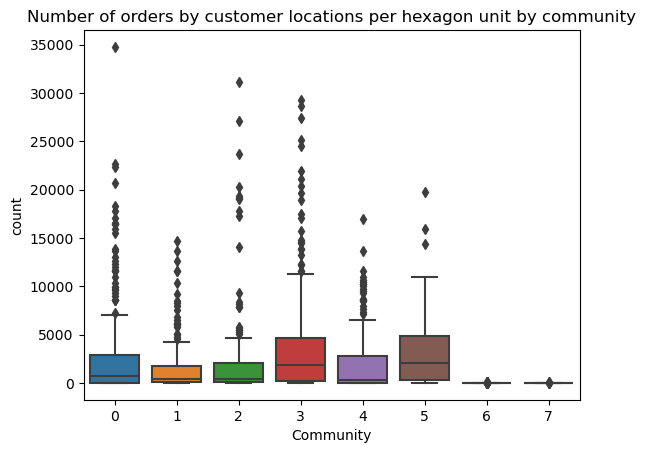

In [283]:
hexagon_withCommunity = hexagon_agg_ordernumber[['count']].merge(community,left_index=True,right_on='Id')

sns.boxplot(data=hexagon_withCommunity, y="count", x="modularity_class")
plt.title("Number of orders by customer locations per hexagon unit by community")
plt.xlabel('Community')
plt.show()

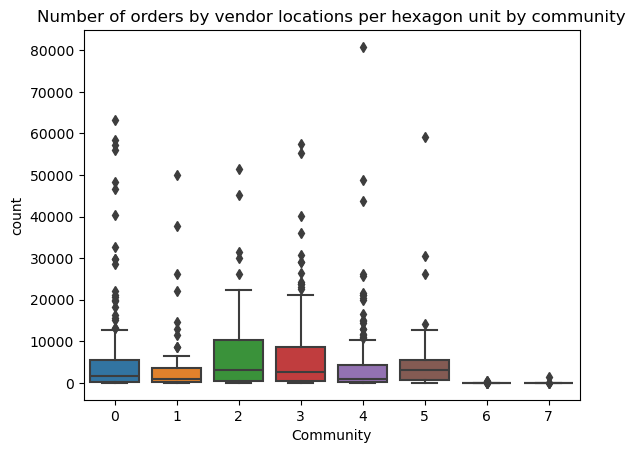

In [282]:
hexagon_withCommunity2 = hexagon_agg_ordernumber2[['count']].merge(community,left_index=True,right_on='Id')
# hexagon_agg_vendors_merge = hexagon_withCommunity2.merge(community,left_on='index_right',right_on='Id')
sns.boxplot(data=hexagon_withCommunity2, y="count", x="modularity_class")
# plt.suptitle('')
plt.title("Number of orders by vendor locations per hexagon unit by community")
plt.xlabel('Community')
plt.show()

# Measure accessibility and regression analysis

In [24]:
import h3

In [363]:
%%time

all_customer_hexagon = df_order.index_destination.unique().tolist() # all hexagons that have customers
df_hex_accessibility = pd.DataFrame()
all_access1halfkm, all_access3km, all_access6km,all_access10km = [],[],[],[]
for hex in all_customer_hexagon: 
    # neighbors = h3.k_ring(hex,1) # 1km neighbors
    neighbors_1halfkm = h3.k_ring(hex,2) # 1.5km neighbors: 0.5+2*0.5=1.5
    neighbors_3km = h3.k_ring(hex,5) # 3km neighbors:  0.5+5*0.5=3
    neighbors_6km = h3.k_ring(hex,11) # 6km neighbors:  0.5+11*0.5=6
    neighbors_10km = h3.k_ring(hex,19) # 10km neighbors:  0.5+19*0.5=10
    
    # hexagon_agg_ordernumber2: number of orders provided by restaurants
    access_restaturant_byordercounts_1halfkm = hexagon_agg_ordernumber2[hexagon_agg_ordernumber2.index.isin(neighbors_1halfkm)]['count'].sum()
    access_restaturant_byordercounts_3km = hexagon_agg_ordernumber2[hexagon_agg_ordernumber2.index.isin(neighbors_3km)]['count'].sum()
    access_restaturant_byordercounts_6km = hexagon_agg_ordernumber2[hexagon_agg_ordernumber2.index.isin(neighbors_6km)]['count'].sum()
    access_restaturant_byordercounts_10km = hexagon_agg_ordernumber2[hexagon_agg_ordernumber2.index.isin(neighbors_10km)]['count'].sum()
    
    all_access1halfkm.append(access_restaturant_byordercounts_1halfkm) 
    all_access3km.append(access_restaturant_byordercounts_3km) 
    all_access6km.append(access_restaturant_byordercounts_6km) 
    all_access10km.append(access_restaturant_byordercounts_10km) 
    

df_hex_accessibility['hex_id'] = all_customer_hexagon
df_hex_accessibility['access_1.5km'] = all_access1halfkm
df_hex_accessibility['access_3km'] = all_access3km
df_hex_accessibility['access_6km'] = all_access6km
df_hex_accessibility['access_10km'] = all_access10km

# donut accessibility
df_hex_accessibility['access_1.5_3km'] = df_hex_accessibility['access_3km'] - df_hex_accessibility['access_1.5km']
df_hex_accessibility['access_3_6km'] = df_hex_accessibility['access_6km'] - df_hex_accessibility['access_3km']
df_hex_accessibility['access_6_10km'] = df_hex_accessibility['access_10km'] - df_hex_accessibility['access_6km']

CPU times: user 21.6 s, sys: 147 ms, total: 21.8 s
Wall time: 21.9 s


In [364]:
df_hex_accessibility.head()

,hex_id,access_1.5km,access_3km,access_6km,access_10km,access_1.5_3km,access_3_6km,access_6_10km
0,8843a13449fffff,48348,233769,958098,2278674,185421,724329,1320576
1,8843ac52cdfffff,8895,19780,171477,729312,10885,151697,557835
2,8843acc8e5fffff,117146,314424,871841,1888028,197278,557417,1016187
3,8843acc9d1fffff,105942,377904,774755,1749682,271962,396851,974927
4,8843accd23fffff,3837,45065,186521,727309,41228,141456,540788


In [390]:
hexagon_correlation = hexagon_agg_ordernumber.merge(df_hex_accessibility,left_index=True,right_on='hex_id')
hexagon_correlation.head(1)

,index,geometry,count,hex_id,access_1.5km,access_3km,access_6km,access_10km,access_1.5_3km,access_3_6km,access_6_10km
1839,0,"POLYGON ((55.39678 25.11768, 55.39853 25.11339, 55.40363 25.11226, 55.40698 25.11542, 55.40523 25.11971, 55.40013 25.12084, 55.39678 25.11768))",1,8843a12459fffff,113276,228842,466724,1324455,115566,237882,857731


In [397]:
slope, intercept, r, p, std_err = stats.linregress(hexagon_correlation['count'],hexagon_correlation['access_1.5km'])
print(round(r,2),p)

slope, intercept, r, p, std_err = stats.linregress(hexagon_correlation['count'],hexagon_correlation['access_3km'])
print(round(r,2),p)

slope, intercept, r, p, std_err = stats.linregress(hexagon_correlation['count'],hexagon_correlation['access_10km'])
print(round(r,2),p)

0.65 7.660781418337827e-229
0.54 3.0376951684773546e-144
0.35 8.85583178397685e-55


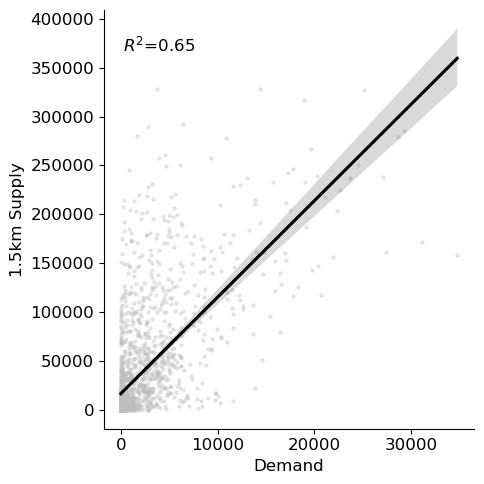

In [367]:
import scipy as sp
import seaborn as sns
from scipy import stats

def annotate(data, **kws):
    slope, intercept, r, p, std_err = stats.linregress(data['count'],data['access_1.5km'])
    ax = plt.gca()
    if p < 0.01:p=0
    ax.text(.05, .9, '$R^2$={:.2f}'.format(r), transform=ax.transAxes)

# plt.rcParams.update({'font.size': 14})
g_all = sns.lmplot(x="count", y="access_1.5km", data=hexagon_correlation,  scatter_kws={'alpha':0.3,'s':5,'color':'#bdbdbd'},
                  line_kws=dict(color='black')) #alpha=0.7,
g_all.map_dataframe(annotate)
g_all.set(xlabel='Demand', ylabel='1.5km Supply')
# plt.title("Boston Metropolitan Area")
plt.tight_layout()
# plt.savefig('./Boston_residential_vs_visit.png',dpi=300,bbox_inches='tight')
plt.show()

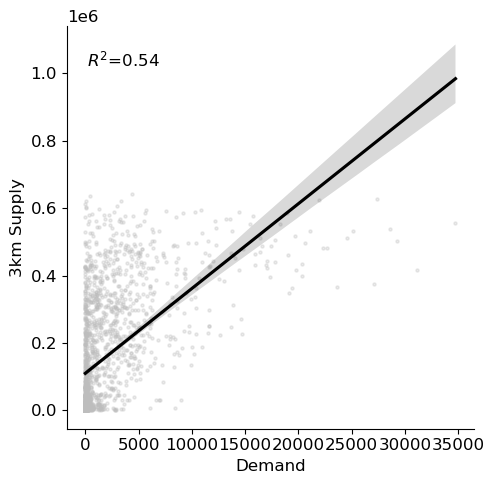

In [399]:
def annotate1_5km(data, **kws):
    slope, intercept, r, p, std_err = stats.linregress(data['count'],data['access_3km'])    
    ax = plt.gca()
    if p < 0.01:p=0
    ax.text(.05, .9, '$R^2$={:.2f}'.format(r), transform=ax.transAxes)
    
g_all = sns.lmplot(x="count", y="access_3km", data=hexagon_correlation,  scatter_kws={'alpha':0.3,'s':5,'color':'#bdbdbd'},
                  line_kws=dict(color='black')) #alpha=0.7,
g_all.map_dataframe(annotate1_5km)
g_all.set(xlabel='Demand', ylabel='3km Supply')
plt.tight_layout()
plt.show()

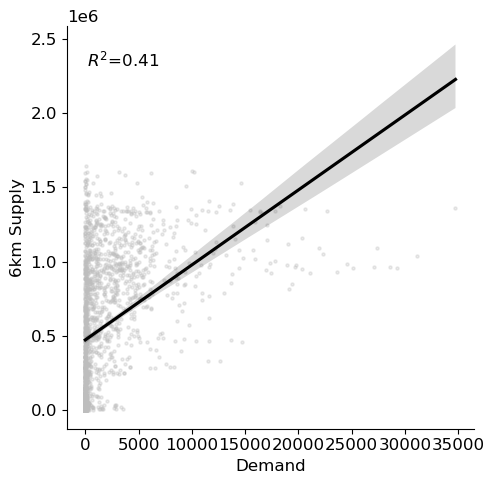

In [401]:
def annotate1_5km(data, **kws):
    slope, intercept, r, p, std_err = stats.linregress(data['count'],data['access_6km'])    
    ax = plt.gca()
    if p < 0.01:p=0
    ax.text(.05, .9, '$R^2$={:.2f}'.format(r), transform=ax.transAxes)
    
g_all = sns.lmplot(x="count", y="access_6km", data=hexagon_correlation,  scatter_kws={'alpha':0.3,'s':5,'color':'#bdbdbd'},
                  line_kws=dict(color='black')) #alpha=0.7,
g_all.map_dataframe(annotate1_5km)
g_all.set(xlabel='Demand', ylabel='6km Supply')
plt.tight_layout()
plt.show()

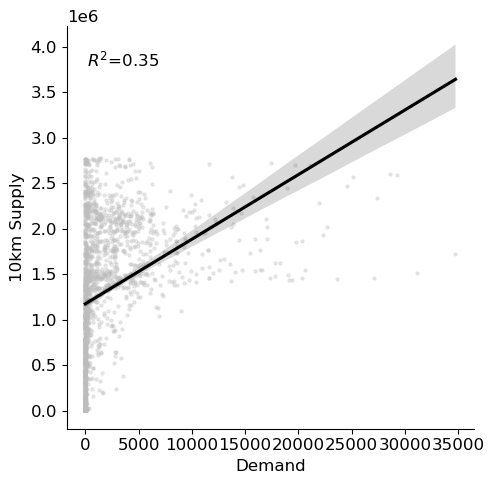

In [400]:
def annotate1_5km(data, **kws):
    slope, intercept, r, p, std_err = stats.linregress(data['count'],data['access_10km'])    
    ax = plt.gca()
    if p < 0.01:p=0
    ax.text(.05, .9, '$R^2$={:.2f}'.format(r), transform=ax.transAxes)
    
g_all = sns.lmplot(x="count", y="access_10km", data=hexagon_correlation,  scatter_kws={'alpha':0.3,'s':5,'color':'#bdbdbd'},
                  line_kws=dict(color='black')) #alpha=0.7,
g_all.map_dataframe(annotate1_5km)
g_all.set(xlabel='Demand', ylabel='10km Supply')
plt.tight_layout()
plt.show()

In [371]:
rent = pd.read_pickle('./rent_hex.pkl')
hexagon_correlation_merge = hexagon_correlation.merge(rent,how='left')
print(hexagon_correlation_merge.shape[0])
hexagon_correlation_merge.head(1)

1908


,index,geometry,count,hex_id,access_1.5km,access_3km,access_6km,access_10km,access_1.5_3km,access_3_6km,access_6_10km,price_persqt,price_quantile
0,0,"POLYGON ((55.39678 25.11768, 55.39853 25.11339, 55.40363 25.11226, 55.40698 25.11542, 55.40523 25.11971, 55.40013 25.12084, 55.39678 25.11768))",1,8843a12459fffff,113276,228842,466724,1324455,115566,237882,857731,NaN,NaN


In [379]:
import statsmodels.api as sm

X = hexagon_correlation_merge[['access_1.5km', 'access_1.5_3km','access_3_6km','access_6_10km']] #'price_persqt'

# Dependent variable
y = hexagon_correlation_merge['count']

# Add constant to the independent variables
X = sm.add_constant(X)

# Fit the negative binomial regression model
model_nb = sm.GLM(y, X, family=sm.families.NegativeBinomial()).fit()

# Print the summary of the model
print(model_nb.summary())

# higher accessibility to food delivery -> more orders
# higher rent -> less orders

                 Generalized Linear Model Regression Results                  
Dep. Variable:                  count   No. Observations:                 1908
Model:                            GLM   Df Residuals:                     1903
Model Family:        NegativeBinomial   Df Model:                            4
Link Function:                    Log   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -14748.
Date:                Fri, 29 Mar 2024   Deviance:                       6634.0
Time:                        08:58:23   Pearson chi2:                 8.66e+03
No. Iterations:                    20   Pseudo R-squ. (CS):             0.8052
Covariance Type:            nonrobust                                         
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
const              4.5578      0.046     98.

/Users/rongxiangsu/anaconda3/lib/python3.11/site-packages/statsmodels/genmod/families/family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


In [383]:
from scipy.stats import chi2

restricted_model = sm.GLM(y, X[['const']], family=sm.families.NegativeBinomial()).fit()
print(restricted_model.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                  count   No. Observations:                 1908
Model:                            GLM   Df Residuals:                     1907
Model Family:        NegativeBinomial   Df Model:                            0
Link Function:                    Log   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -16308.
Date:                Fri, 29 Mar 2024   Deviance:                       9755.3
Time:                        09:00:07   Pearson chi2:                 7.44e+03
No. Iterations:                     6   Pseudo R-squ. (CS):          2.978e-12
Covariance Type:            nonrobust                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          7.5470      0.023    329.571      0.0

/Users/rongxiangsu/anaconda3/lib/python3.11/site-packages/statsmodels/genmod/families/family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


In [310]:
# def annotate1_5km(data, **kws):
#     slope, intercept, r, p, std_err = stats.linregress(data['count'],data['access_5km'])    
#     ax = plt.gca()
#     if p < 0.01:p=0
#     ax.text(.05, .9, '$R^2$={:.2f}'.format(r), transform=ax.transAxes)
    
# g_all = sns.lmplot(x="count", y="access_5km", data=hexagon_correlation,  scatter_kws={'alpha':0.3,'s':5,'color':'#bdbdbd'},
#                   line_kws=dict(color='black')) #alpha=0.7,
# g_all.map_dataframe(annotate1_5km)
# g_all.set(xlabel='Demand', ylabel='5km Supply')
# plt.tight_layout()
# plt.show()

double check the results

In [386]:
# checkhexid = '8843a12459fffff'
# # plot_check = hexagon_correlation[hexagon_correlation['hex_id']==checkhexid]

# neighbors = h3.k_ring(checkhexid, 9)  # 0.5+9*0.5=5
# plot_check = hexagon_correlation[hexagon_correlation.hex_id.isin(neighbors)]

# f, ax = plt.subplots(1, figsize=(9, 9))

# hexagon_correlation.plot(ax=ax,facecolor="#adadad", linewidth=0.2,edgecolor="white")
# plot_check.plot(ax=ax,facecolor="red",linewidth=0.2,edgecolor="white") 
# cx.add_basemap(ax, crs=hexagon_correlation.crs, source=cx.providers.CartoDB.Positron)
# plt.show()

In [387]:
# plot_check

In [388]:
# hexagon_agg_ordernumber[hexagon_agg_ordernumber.index==checkhexid]

In [389]:
# neighbors = h3.k_ring(checkhexid,1)
# hexagon_agg_ordernumber[hexagon_agg_ordernumber.index.isin(neighbors)]

Based on the above results, for this hexagon, it has very low demand (delivery order) just because it happens to locate in a 
University campus (perhaps mostly teaching buildings without residents or college students can go to cafeteria). We can see actually there are many demands in its neighbors.


# Bivariate LISA

In [64]:
%matplotlib inline

import matplotlib.pyplot as plt
from libpysal.weights.contiguity import Queen
from libpysal import examples
import numpy as np
import pandas as pd
import geopandas as gpd
import os
import splot
from esda.moran import Moran_Local_BV
from splot.esda import moran_scatterplot
from esda.moran import Moran_Local
from splot.esda import lisa_cluster

In [65]:
hexagon_correlation.head()

,index,geometry,count,hex_id,accessibility
1839,0,"POLYGON ((55.39678 25.11768, 55.39853 25.11339, 55.40363 25.11226, 55.40698 25.11542, 55.40523 25.11971, 55.40013 25.12084, 55.39678 25.11768))",1,8843a12459fffff,36116
1881,0,"POLYGON ((55.50026 25.26281, 55.50201 25.25851, 55.50713 25.25737, 55.51049 25.26054, 55.50874 25.26484, 55.50363 25.26598, 55.50026 25.26281))",1,8843accd01fffff,0
932,0,"POLYGON ((55.14929 25.12156, 55.15106 25.11728, 55.15615 25.11616, 55.15949 25.11932, 55.15772 25.12360, 55.15262 25.12472, 55.14929 25.12156))",92,8843a132b9fffff,15
1871,0,"POLYGON ((55.59813 25.34295, 55.59988 25.33864, 55.60500 25.33750, 55.60838 25.34067, 55.60663 25.34498, 55.60150 25.34612, 55.59813 25.34295))",1,8843accc93fffff,0
32,0,"POLYGON ((55.47847 25.23634, 55.48022 25.23204, 55.48534 25.23090, 55.48870 25.23407, 55.48695 25.23837, 55.48183 25.23950, 55.47847 25.23634))",1276,8843ac5259fffff,10778


In [66]:
hexagon_correlation.to_file('./shp/hexagon_correlation.shp', driver='ESRI Shapefile')

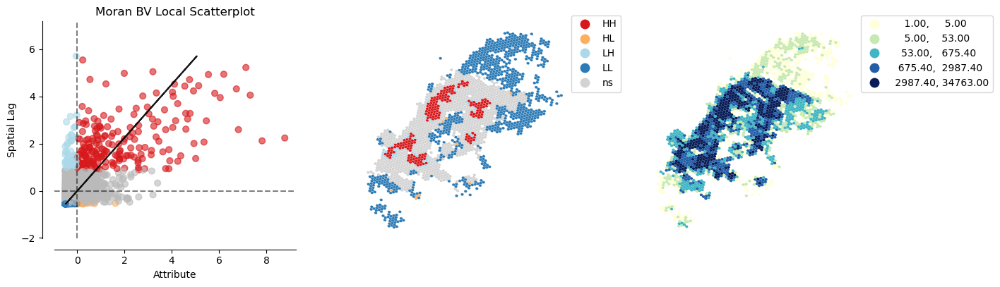

CPU times: user 4.94 s, sys: 1.72 s, total: 6.66 s
Wall time: 2.61 s


In [82]:
%%time
from libpysal.weights import KNN

# w=Queen.from_shapefile("./shp/hexagon_correlation.shp")
w=KNN.from_shapefile("./shp/hexagon_correlation.shp",k=6)
w.transform = 'r'
# w.pct_nonzero
x = hexagon_correlation['count'].values
y = hexagon_correlation['accessibility'].values
moran_loc_bv = Moran_Local_BV(x, y, w, permutations=10000)

from splot.esda import plot_local_autocorrelation

plot_local_autocorrelation(moran_loc_bv, hexagon_correlation, 'count')
plt.show()

In [83]:
# Break observations into significant or not
hexagon_correlation['significant'] = moran_loc_bv.p_sim < 0.05
# Store the quadrant they belong to
hexagon_correlation['quadrant'] = moran_loc_bv.q
#The correspondence between the numbers in the variable and the actual quadrants is as follows:
# 1: HH
# 2: LH
# 3: LL
# 4: HL

In [88]:
hexagon_correlation.loc[hexagon_correlation['quadrant']==1, 'quadrant'] = 'HH'
hexagon_correlation.loc[hexagon_correlation['quadrant']==2, 'quadrant'] = 'LH'
hexagon_correlation.loc[hexagon_correlation['quadrant']==3, 'quadrant'] = 'LL'
hexagon_correlation.loc[hexagon_correlation['quadrant']==4, 'quadrant'] = 'HL'

In [89]:
hexagon_correlation_significant = hexagon_correlation[hexagon_correlation['significant']==True]
hexagon_correlation_significant['quadrant'].value_counts()

quadrant
LL    768
HH    198
LH    50 
HL    9  
Name: count, dtype: int64

In [111]:
lh = hexagon_correlation[(hexagon_correlation['quadrant']=='LH') & (hexagon_correlation['significant']==True)] #low order count, high accessibility
hl = hexagon_correlation[(hexagon_correlation['quadrant']=='HL') & (hexagon_correlation['significant']==True)]
hh = hexagon_correlation[(hexagon_correlation['quadrant']=='HH') & (hexagon_correlation['significant']==True)]
ll = hexagon_correlation[(hexagon_correlation['quadrant']=='LL') & (hexagon_correlation['significant']==True)]
# print(lh['count'].describe()) 
# print(lh['accessibility'].describe()) 
# print(hl['count'].describe()) 
# print(hl['accessibility'].describe()) 

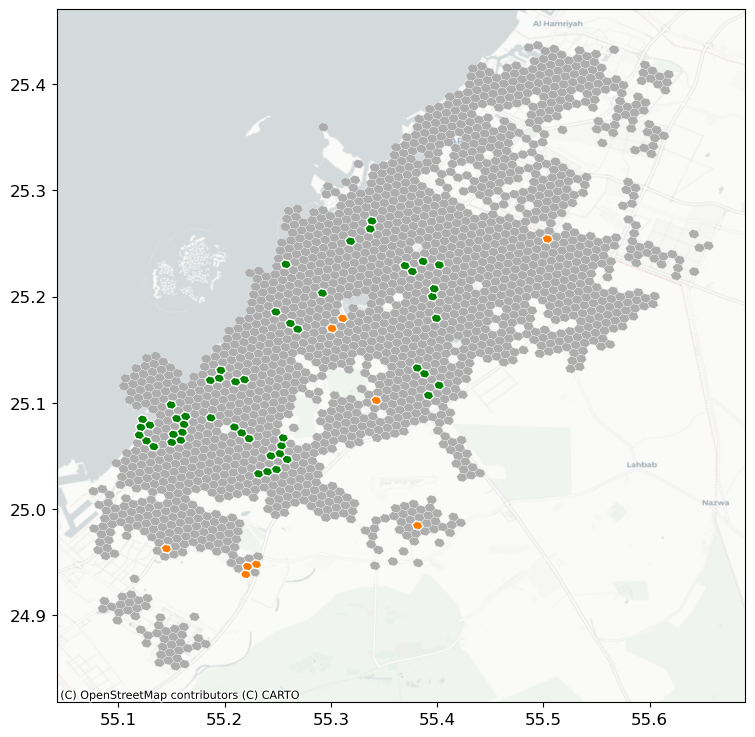

In [114]:
import contextily as cx

plt.rcParams.update({'font.size': 12})
f, ax = plt.subplots(1, figsize=(9, 9))
hexagon_correlation.plot(ax=ax,facecolor="#adadad", linewidth=0.2,edgecolor="white")#, edgecolor="black", linewidth=1
lh.plot(ax=ax, color='green', edgecolor="white") #, label='Low-High'
hl.plot(ax=ax, color='#ff7b00',edgecolor="white") #, label='High-Low'
# plt.legend() # title='Categories'
cx.add_basemap(ax, crs=hexagon_correlation.crs, source=cx.providers.CartoDB.Positron)
# plt.savefig('./Bos_low_high_cluster.png',dpi=300,bbox_inches='tight')
plt.show()

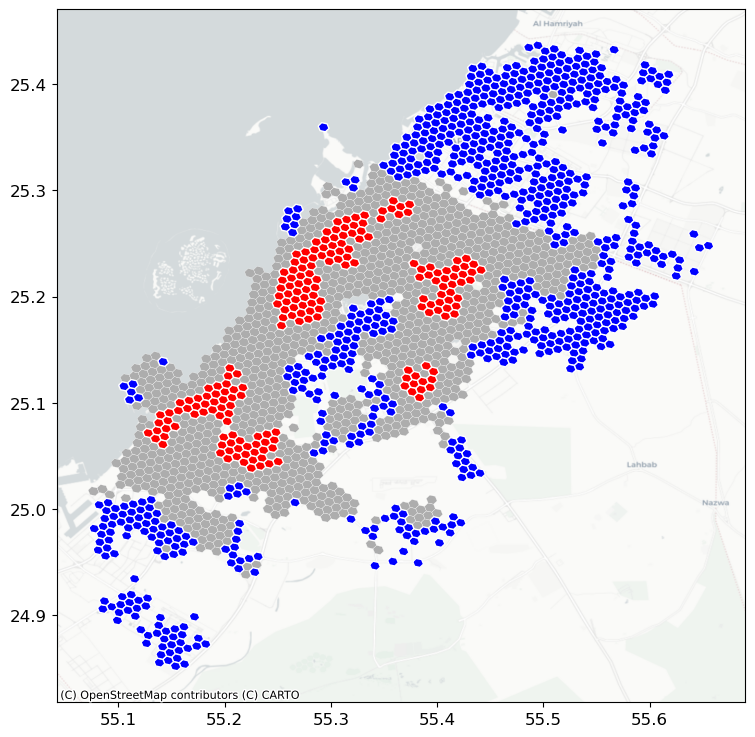

In [113]:
plt.rcParams.update({'font.size': 12})
f, ax = plt.subplots(1, figsize=(9, 9))
hexagon_correlation.plot(ax=ax,facecolor="#adadad", linewidth=0.2,edgecolor="white")#, edgecolor="black", linewidth=1
hh.plot(ax=ax, color='red', edgecolor="white") 
ll.plot(ax=ax, color='blue', edgecolor="white") 
cx.add_basemap(ax, crs=hexagon_correlation.crs, source=cx.providers.CartoDB.Positron)
# plt.savefig('./Bos_low_high_cluster.png',dpi=300,bbox_inches='tight')
plt.show()

# Orders within/outside hexagon

In [150]:
df_order.index_destination.unique().shape[0]

1908

In [133]:
df_local_orders_statistics = df_order
df_local_orders_statistics['same_hexagon'] = df_local_orders_statistics['index_origin'] == df_local_orders_statistics['index_destination']

In [312]:
df_local_orders_statistics.same_hexagon.value_counts()

same_hexagon
False    3460022
True     155701 
Name: count, dtype: int64

In [314]:
%%time
def is_neighbor(row):
    all_neighbors = h3.k_ring(row['index_destination'],1) #1km
    if row['index_origin'] in all_neighbors:
        return True
    else:
        return False

def is_2kmneighbor(row):
    all_neighbors = h3.k_ring(row['index_destination'],3) #2km
    if row['index_origin'] in all_neighbors:
        return True
    else:
        return False
        
df_local_orders_statistics['is_1storder_hex'] = df_local_orders_statistics.apply(lambda row: is_neighbor(row), axis=1)
df_local_orders_statistics['is_2km_hex'] = df_local_orders_statistics.apply(lambda row: is_2kmneighbor(row), axis=1)

CPU times: user 4min 20s, sys: 31.7 s, total: 4min 52s
Wall time: 5min 11s


In [313]:
df_local_orders_statistics.is_1storder_hex.value_counts()

is_1storder_hex
False    2969912
True     645811 
Name: count, dtype: int64

In [318]:
df_local_need = df_local_orders_statistics[['index_destination','same_hexagon','is_1storder_hex','is_2km_hex']]

compute total number of orders in a hexagon

In [161]:
total_count_withinhexagon = df_local_need[['index_destination','same_hexagon']].groupby('index_destination').count().reset_index()
total_count_withinhexagon = total_count_withinhexagon.rename(columns={"same_hexagon": "total_orderin_hexagon"})
total_count_withinhexagon

,index_destination,total_orderin_hexagon
0,8843a10491fffff,3
1,8843a10493fffff,139
2,8843a104b3fffff,1
3,8843a104b7fffff,3
4,8843a104bbfffff,1
...,...,...
1903,8843acd9e5fffff,705
1904,8843acd9e7fffff,2610
1905,8843acd9e9fffff,16
1906,8843acd9ebfffff,2


percent of orders from restaurants within 0.5km (the same hexagon)

In [317]:
# df_withinhexagon_percent = df_local_need.groupby(['index_destination','same_hexagon']).count().reset_index()
# df_withinhexagon_percent = df_withinhexagon_percent[df_withinhexagon_percent['same_hexagon']==True]
# df_withinhexagon_percent = df_withinhexagon_percent.rename(columns={"is_1storder_hex": "count"})
# df_withinhexagon_percent = df_withinhexagon_percent.merge(total_count_withinhexagon,how='right')
# df_withinhexagon_percent['percent_samehex'] = df_withinhexagon_percent['count'] / df_withinhexagon_percent['total_orderin_hexagon']
# df_withinhexagon_percent = df_withinhexagon_percent[['index_destination','percent_samehex']]
# df_withinhexagon_percent = df_withinhexagon_percent.fillna(0)
# df_withinhexagon_percent

In [316]:
# select_attr = 'percent_samehex' 
# hexagon_agg_attribute = hexagons.merge(df_withinhexagon_percent,left_index=True,right_on='index_destination')
# print(hexagon_agg_attribute.shape[0])
# ax = hexagon_agg_attribute.plot(figsize=(15, 15), cmap='Reds',column=select_attr,legend=True,edgecolor='white')
# xmin, ymin, xmax, ymax = hexagon_agg_attribute.total_bounds
# pad = 0.1  # add a padding around the geometry
# ax.set_xlim(xmin-pad, xmax+pad)
# ax.set_ylim(ymin-pad, ymax+pad)
# cx.add_basemap(ax, crs=hexagon_agg_attribute.crs, source=cx.providers.OpenStreetMap.Mapnik)
# plt.title(select_attr)

percent of orders from restaurants within 1km

In [330]:
df_within1storderhexagon_percent = df_local_need.groupby(['index_destination','is_1storder_hex']).count().reset_index()
df_within1storderhexagon_percent = df_within1storderhexagon_percent[df_within1storderhexagon_percent['is_1storder_hex']==True]
df_within1storderhexagon_percent = df_within1storderhexagon_percent.rename(columns={"same_hexagon": "count"})
df_within1storderhexagon_percent = df_within1storderhexagon_percent.merge(total_count_withinhexagon,how='right')
df_within1storderhexagon_percent['percent_1storderhex'] = df_within1storderhexagon_percent['count'] / df_within1storderhexagon_percent['total_orderin_hexagon']
df_within1storderhexagon_percent = df_within1storderhexagon_percent[['index_destination','percent_1storderhex']]
df_within1storderhexagon_percent = df_within1storderhexagon_percent.fillna(0)
df_within1storderhexagon_percent

,index_destination,percent_1storderhex
0,8843a10491fffff,0.000000
1,8843a10493fffff,0.000000
2,8843a104b3fffff,0.000000
3,8843a104b7fffff,0.000000
4,8843a104bbfffff,0.000000
...,...,...
1903,8843acd9e5fffff,0.212766
1904,8843acd9e7fffff,0.158238
1905,8843acd9e9fffff,0.000000
1906,8843acd9ebfffff,0.000000


1908


Text(0.5, 1.0, 'percent_1storderhex')

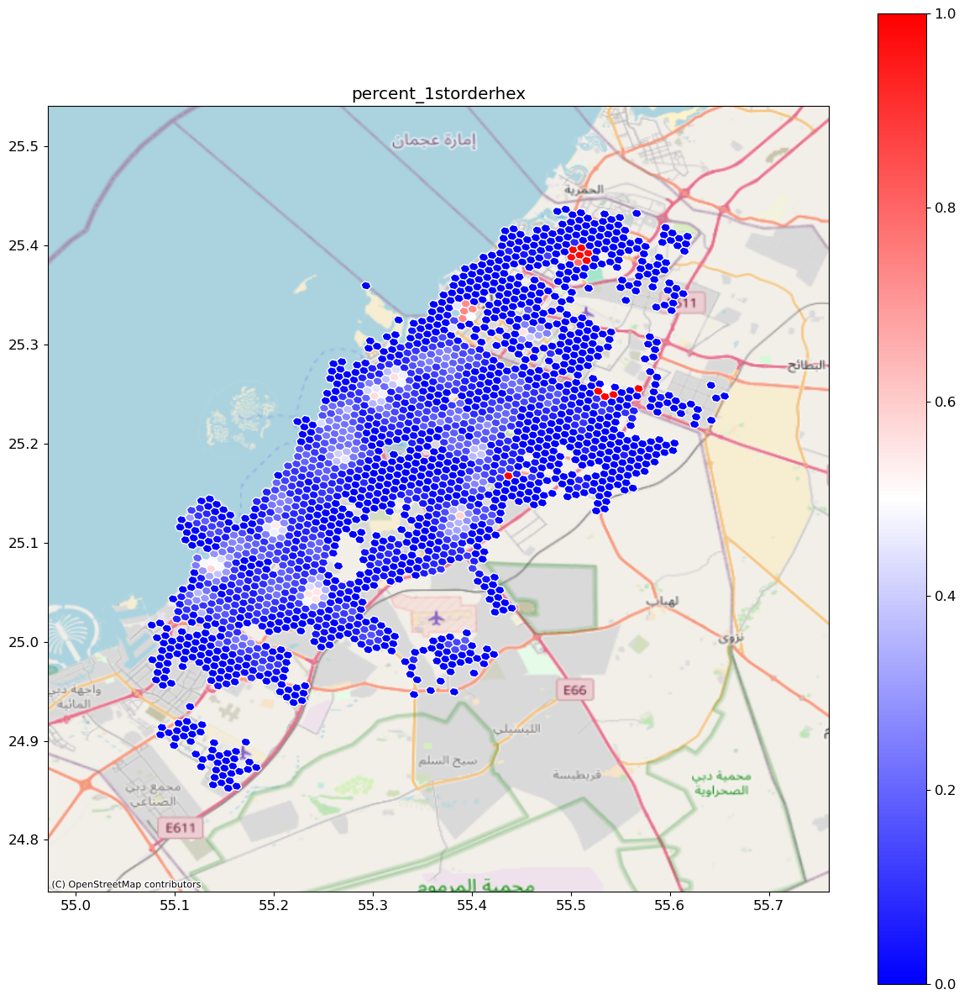

In [331]:
select_attr = 'percent_1storderhex' 
hexagon_agg_attribute = hexagons.merge(df_within1storderhexagon_percent,left_index=True,right_on='index_destination')
print(hexagon_agg_attribute.shape[0])
ax = hexagon_agg_attribute.plot(figsize=(15, 15), cmap='bwr',column=select_attr,legend=True,edgecolor='white')
xmin, ymin, xmax, ymax = hexagon_agg_attribute.total_bounds
pad = 0.1  # add a padding around the geometry
ax.set_xlim(xmin-pad, xmax+pad)
ax.set_ylim(ymin-pad, ymax+pad)
cx.add_basemap(ax, crs=hexagon_agg_attribute.crs, source=cx.providers.OpenStreetMap.Mapnik)
plt.title(select_attr)

percent of orders from restaurants within 2km

In [319]:
df_within1storderhexagon_percent = df_local_need.groupby(['index_destination','is_2km_hex']).count().reset_index()
df_within1storderhexagon_percent = df_within1storderhexagon_percent[df_within1storderhexagon_percent['is_2km_hex']==True]
df_within1storderhexagon_percent = df_within1storderhexagon_percent.rename(columns={"same_hexagon": "count"})
df_within1storderhexagon_percent = df_within1storderhexagon_percent.merge(total_count_withinhexagon,how='right')
df_within1storderhexagon_percent['percent_2km_hex'] = df_within1storderhexagon_percent['count'] / df_within1storderhexagon_percent['total_orderin_hexagon']
df_within1storderhexagon_percent = df_within1storderhexagon_percent[['index_destination','percent_2km_hex']]
df_within1storderhexagon_percent = df_within1storderhexagon_percent.fillna(0)
df_within1storderhexagon_percent

,index_destination,percent_2km_hex
0,8843a10491fffff,0.000000
1,8843a10493fffff,0.014388
2,8843a104b3fffff,0.000000
3,8843a104b7fffff,0.000000
4,8843a104bbfffff,0.000000
...,...,...
1903,8843acd9e5fffff,0.409929
1904,8843acd9e7fffff,0.378544
1905,8843acd9e9fffff,0.062500
1906,8843acd9ebfffff,0.000000


1908


Text(0.5, 1.0, 'percent_2km_hex')

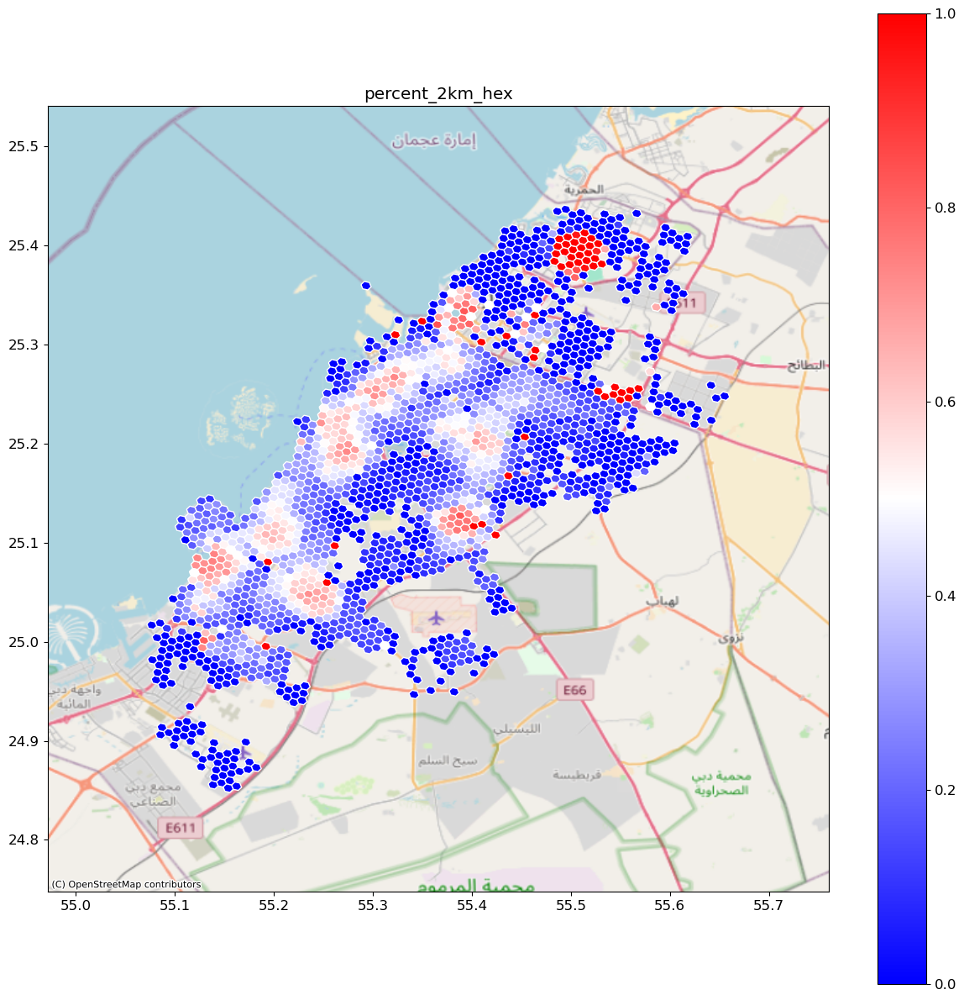

In [322]:
select_attr = 'percent_2km_hex' 
hexagon_agg_attribute = hexagons.merge(df_within1storderhexagon_percent,left_index=True,right_on='index_destination')
print(hexagon_agg_attribute.shape[0])
ax = hexagon_agg_attribute.plot(figsize=(15, 15), cmap='bwr',column=select_attr,legend=True,edgecolor='white')
xmin, ymin, xmax, ymax = hexagon_agg_attribute.total_bounds
pad = 0.1  # add a padding around the geometry
ax.set_xlim(xmin-pad, xmax+pad)
ax.set_ylim(ymin-pad, ymax+pad)
cx.add_basemap(ax, crs=hexagon_agg_attribute.crs, source=cx.providers.OpenStreetMap.Mapnik)
plt.title(select_attr)

In [228]:
# hexagon_agg_attribute[hexagon_agg_attribute['percent_1storderhex']==1]

,index,geometry,index_destination,percent_1storderhex
1290,0,"POLYGON ((55.49698 25.39671, 55.49873 25.39240, 55.50386 25.39127, 55.50723 25.39444, 55.50548 25.39875, 55.50035 25.39988, 55.49698 25.39671))",8843acc531fffff,1.0
1755,0,"POLYGON ((55.56328 25.25666, 55.56502 25.25236, 55.57014 25.25122, 55.57351 25.25439, 55.57176 25.25869, 55.56665 25.25983, 55.56328 25.25666))",8843accda1fffff,1.0
1101,0,"POLYGON ((55.53782 25.25057, 55.53957 25.24627, 55.54469 25.24513, 55.54806 25.24830, 55.54631 25.25260, 55.54119 25.25373, 55.53782 25.25057))",8843ac52d9fffff,1.0
1291,0,"POLYGON ((55.50548 25.39875, 55.50723 25.39444, 55.51236 25.39331, 55.51573 25.39648, 55.51398 25.40079, 55.50885 25.40193, 55.50548 25.39875))",8843acc533fffff,1.0
1504,0,"POLYGON ((55.43175 25.16851, 55.43350 25.16421, 55.43861 25.16308, 55.44196 25.16624, 55.44021 25.17054, 55.43510 25.17167, 55.43175 25.16851))",8843acc9a5fffff,1.0
1729,0,"POLYGON ((55.52934 25.24854, 55.53109 25.24423, 55.53621 25.24310, 55.53957 25.24627, 55.53782 25.25057, 55.53271 25.25170, 55.52934 25.24854))",8843accd37fffff,1.0
1726,0,"POLYGON ((55.52248 25.25397, 55.52423 25.24967, 55.52934 25.24854, 55.53271 25.25170, 55.53096 25.25600, 55.52584 25.25714, 55.52248 25.25397))",8843accd31fffff,1.0
1814,0,"POLYGON ((55.51074 25.38583, 55.51250 25.38152, 55.51762 25.38038, 55.52099 25.38356, 55.51924 25.38787, 55.51411 25.38900, 55.51074 25.38583))",8843acceddfffff,1.0


In [350]:
# # hexagon_agg_attribute.explore()
# hexagon_agg_attribute.explore(
#     column="percent_1storderhex",  # make choropleth based on "BoroName" column
#     tooltip="percent_1storderhex",  # show "BoroName" value in tooltip (on hover)
#     popup=True,  # show all values in popup (on click)
#     tiles="OpenStreetMap",  # use "CartoDB positron" tiles
#     cmap="Reds",  # use "Set1" matplotlib colormap
#     style_kwds=dict(color="gray",weight='0.1') 
# )